## LAB 3: IMAGE SEGMENTATION

### BY: ALBERTO CASTELLANO MACÍAS (100414242)
### & MOHAMED AFIF CHIFAOUI (100452024)

### Baseline System

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from sklearn.metrics import jaccard_score
from skimage.util import img_as_float
from skimage.measure import label
from skimage.filters import threshold_otsu, gaussian
import cv2

# -----------------------------------------------------------------------------
#
#     FUNCTIONS
#
# -----------------------------------------------------------------------------

# ----------------------------- Segmentation function -------------------------
def cell_segmentation(img_file):
    """
    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
    %                                                                       %
    %  Template for implementing the main function of the segmentation      %
    % system: 'cell_segmentation'                                           %
    % - Input: path to the image to be segmented                     %
    % - Output: predicted segmentation mask                                 %
    %                                                                       %
    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

    CELL_SEGMENTATION:
    - - -  COMPLETE - - -
    """
    # Code for the BASELINE system
    # - - - IMPLEMENT HERE YOUR PROPOSED SYSTEM - - -

    image = io.imread(img_file)
    image = img_as_float(image)
    image = gaussian(image, 2)
    otsu_th = threshold_otsu(image)
    predicted_mask = (image > otsu_th).astype('int')

    # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
    return predicted_mask

# ----------------------------- Evaluation function ---------------------------
def evaluate_masks(img_files, gt_mask_files):
    """ EVALUATE_MASKS:
        It receives two lists:
        1) A list of the paths to the images to be analysed
        2) A list of the paths to the corresponding Ground-Truth (GT)
            segmentations
        For each iamge on the list:
            It perform the segmentation
            It determines Jaccard Index
        Finally, it computes an average Jaccard Index for all the images in
        the list
    """
    def label2masks(label_image):
        M,N=label_image.shape
        Num_labels=np.max(label_image)
        masks=np.zeros((M,N,Num_labels),dtype=int)
        # print(f"Num_labels={Num_labels}")
        for l in range(1,Num_labels+1):
            masks[label_image==l,l-1]=1
        return masks

    # Getting the size of the images
    mask0=io.imread(gt_mask_files[0])
    M,N=mask0.shape
    # Downsampling factor to make the evaluation computationally efficient
    downs_f=0.1
    m=round(M*downs_f)
    n=round(N*downs_f)
    # Array containing the IoU associated with each image
    IoU=np.zeros(len(img_files))

    for i in range(len(img_files)):

        # Image segmentation & labeling
        predicted_mask = cell_segmentation(img_files[i])
        predicted_mask_label =label(predicted_mask)

        # Mask downsampling for computational reasons
        predicted_mask_label = cv2.resize(predicted_mask_label, (n, m), interpolation = cv2.INTER_NEAREST)

        # Reading and downsampling ground-truth segmentations
        gt_label = io.imread(gt_mask_files[i])
        gt_label = cv2.resize(gt_label, (n, m), interpolation = cv2.INTER_NEAREST)

        # Converting the groundtruth label images into individual masks (one per cell)
        gt_masks=label2masks(gt_label)
        # Number of cells (groundtruth segmentation)
        Num_gt_cells=np.max(gt_label)

        # Converting the predicted label images into individual masks (one per object)
        pred_masks=label2masks(predicted_mask_label)
        # Number of predicted objects
        Num_pred_cells=np.max(predicted_mask_label)

        # Computing the IoU of each cell with respect to the groundtruth segmentation
        # (aproximate estimation)
        IoU_max=np.zeros((Num_gt_cells,2))
        for gt in range(Num_gt_cells):
            scores=np.zeros(Num_pred_cells)
            for pred in range(Num_pred_cells):
                if (np.sum(gt_masks[:,:,gt])==0 or np.sum(pred_masks[:,:,pred])==0):
                    # print("zero check!")
                    scores[pred]=0.0
                else:
                    scores[pred]=jaccard_score(gt_masks[:,:,gt].flatten(), pred_masks[:,:,pred].flatten())

            # For each cell in the groudtruth segmentation,
            # IoU_max stores the maximum IoU achived after computing the IoU
            # with respect to each object in the predicted segmentation
            IoU_max[gt,0]=np.max(scores)
            IoU_max[gt,1]=np.argmax(scores)

        # The IoU of each image is computed as the average of IoU of each groundtruth cell
        IoU[i]=np.average(IoU_max[:,0])
        print (f"Image {i}, IoU={IoU[i]}")


    return np.average(IoU)

plt.close('all')

# -----------------------------------------------------------------------------
#
#     READING IMAGES
#
# -----------------------------------------------------------------------------

data_dir= os.curdir
path_im='/content/drive/My Drive/AUDIO/LS3_materials/Dataset/subset/rawimages'
path_gt='/content/drive/My Drive/AUDIO/LS3_materials/Dataset/subset/groundtruth'
img_files = [ os.path.join(data_dir,path_im,f) for f in sorted(os.listdir(os.path.join(data_dir,path_im)))
            if (os.path.isfile(os.path.join(data_dir,path_im,f)) and f.endswith('.tif')) ]

gt_mask_files = [ os.path.join(data_dir,path_gt,f) for f in sorted(os.listdir(os.path.join(data_dir,path_gt)))
            if (os.path.isfile(os.path.join(data_dir,path_gt,f)) and f.endswith('.tif')) ]
# img_files.sort()
# gt_mask_files.sort()
print("Number of train images", len(img_files))
print("Number of image masks", len(gt_mask_files))

# -----------------------------------------------------------------------------
#
#     Segmentation and evaluation
#
# -----------------------------------------------------------------------------

mean_score = evaluate_masks(img_files, gt_mask_files)
print(f"Average IoU={mean_score}")

Number of train images 40
Number of image masks 40
Image 0, IoU=0.5941136560888924
Image 1, IoU=0.5028149396672498
Image 2, IoU=0.8945793473165042
Image 3, IoU=0.4950453998768271
Image 4, IoU=0.7078383661302652
Image 5, IoU=0.8634607110694548
Image 6, IoU=0.8746064638988729
Image 7, IoU=0.9269216814403881
Image 8, IoU=0.41145771489060373
Image 9, IoU=0.9394861881106864
Image 10, IoU=0.5885919865357665
Image 11, IoU=0.5373024865106577
Image 12, IoU=0.8808513866792759
Image 13, IoU=0.33850667500990456
Image 14, IoU=0.8511493336387563
Image 15, IoU=0.8863635089105222
Image 16, IoU=0.7505235685331823
Image 17, IoU=0.5277844062252305
Image 18, IoU=0.27586231449994014
Image 19, IoU=0.7809312521624946
Image 20, IoU=0.912808238108174
Image 21, IoU=0.6894202899676997
Image 22, IoU=0.8379911828906689
Image 23, IoU=0.502705915043425
Image 24, IoU=0.6079616298559053
Image 25, IoU=0.8931310192294419
Image 26, IoU=0.3719647662359396
Image 27, IoU=0.3731638969340235
Image 28, IoU=0.7162394562593298
I

### Implemented Final System

Number of train images 40
Number of image masks 40


<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


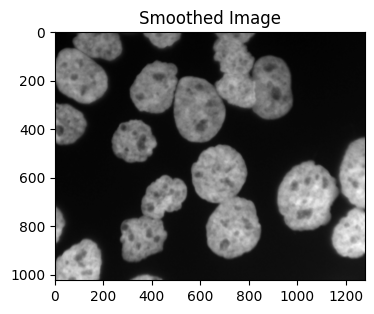

Minimum pixel value: 21
Maximum pixel value: 197


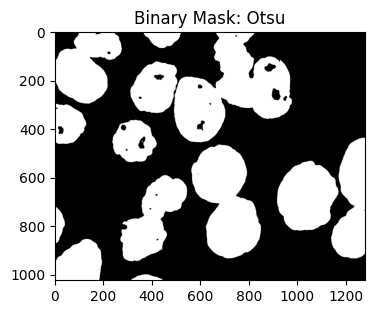

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


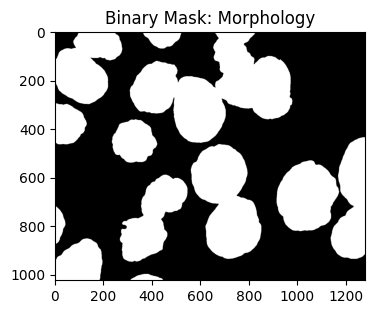

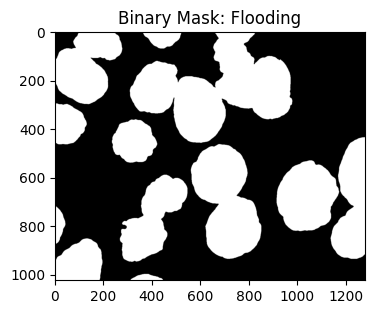

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


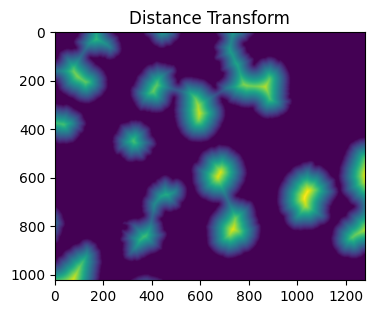

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 115.35163631262454
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 0, IoU=0.880008132573832
Image 0, IoU=0.880008132573832


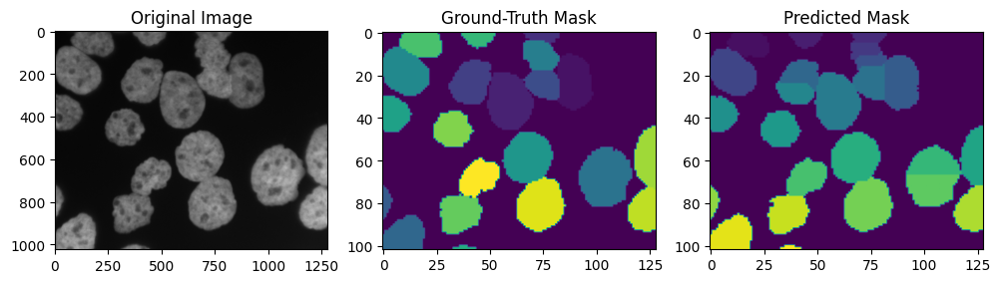

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


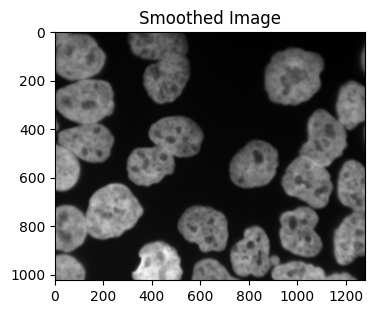

Minimum pixel value: 21
Maximum pixel value: 205


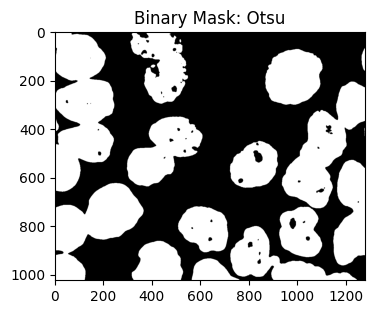

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


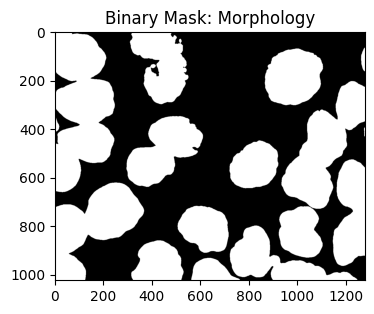

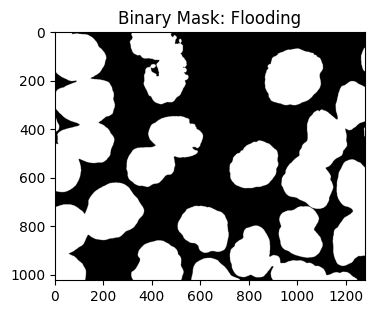

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


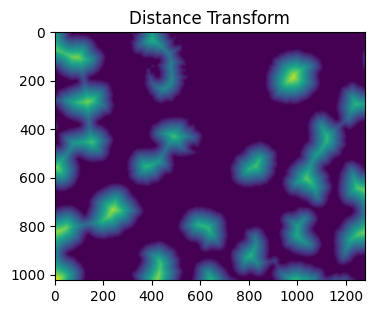

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 121.31364309095659
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 1, IoU=0.8644725888521775
Image 1, IoU=0.8644725888521775


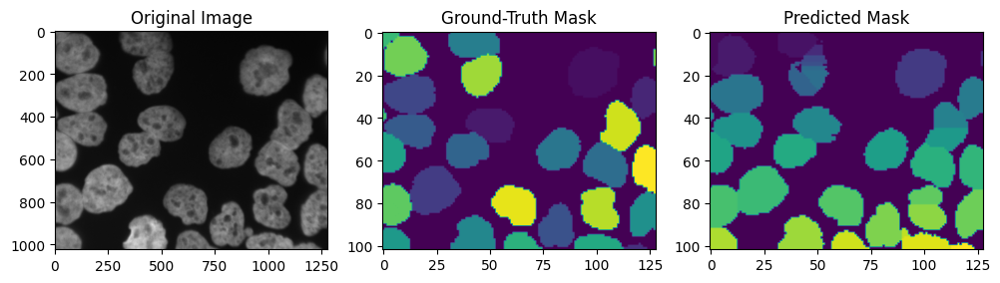

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


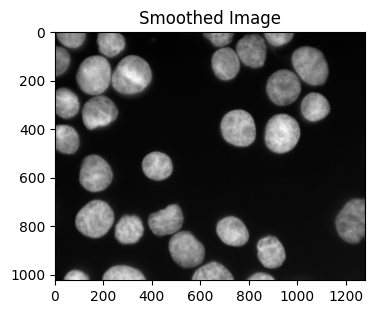

Minimum pixel value: 32
Maximum pixel value: 228


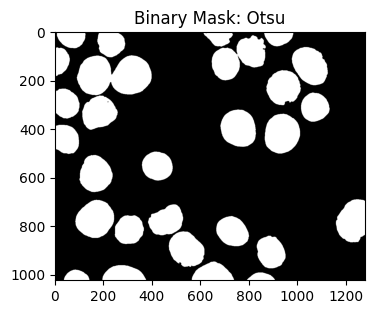

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


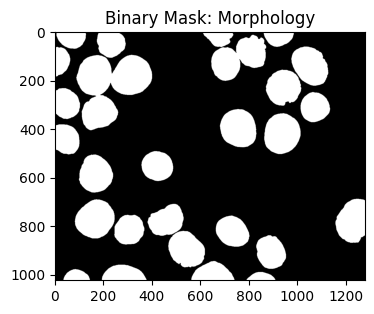

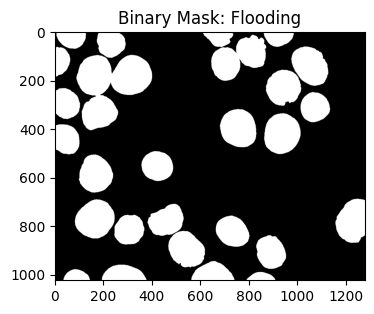

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


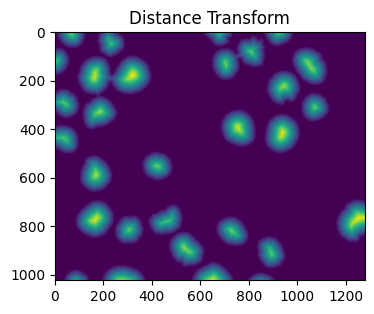

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 76.69419795525604
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 2, IoU=0.9396652289808144
Image 2, IoU=0.9396652289808144


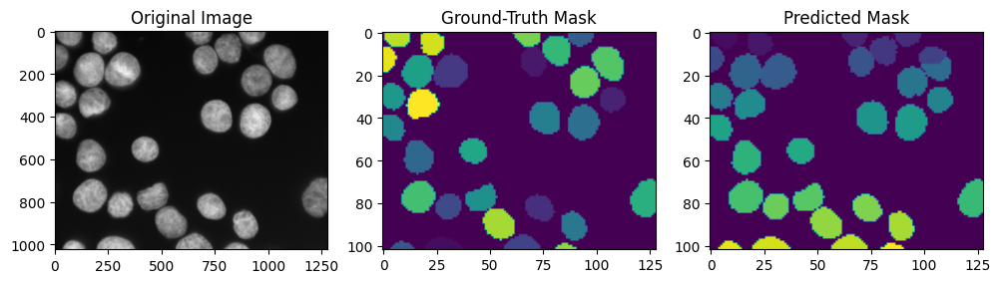

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


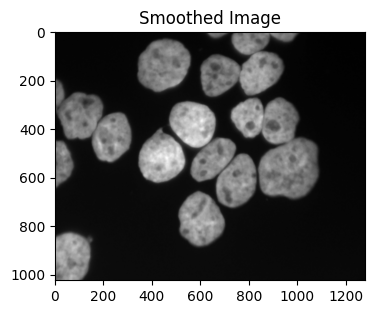

Minimum pixel value: 18
Maximum pixel value: 202


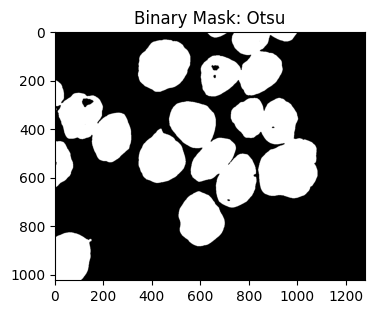

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


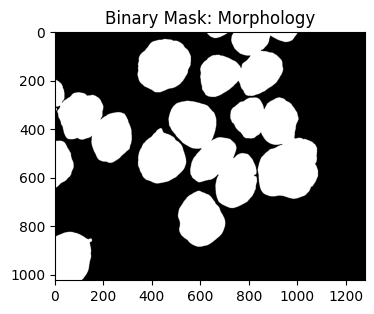

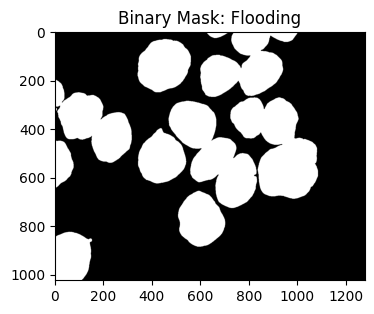

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


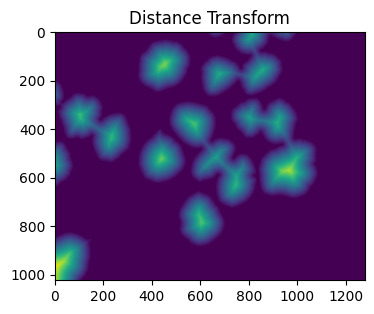

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 123.8789731956154
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 3, IoU=0.945730115940473
Image 3, IoU=0.945730115940473


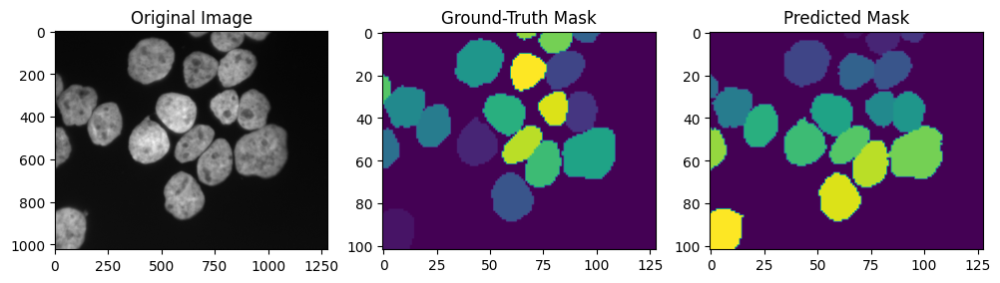

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


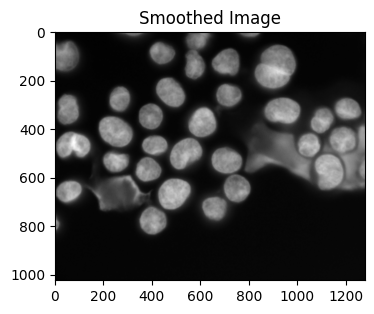

Minimum pixel value: 13
Maximum pixel value: 187


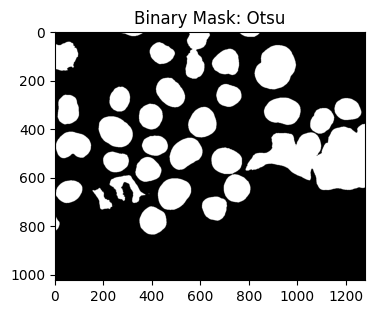

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


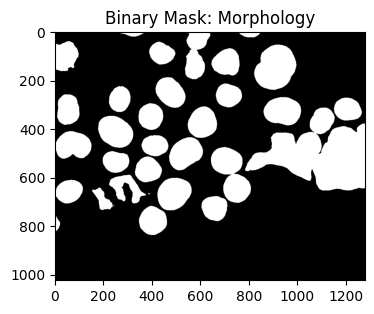

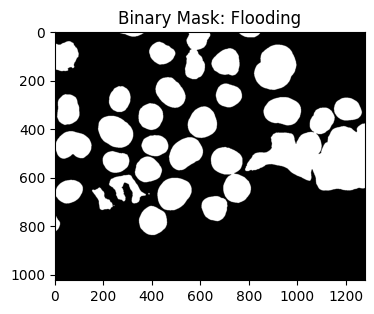

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


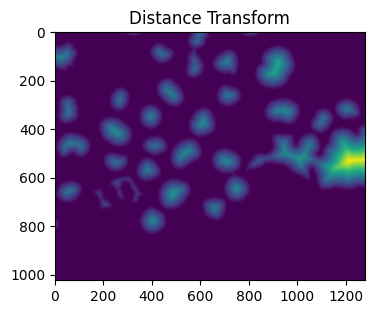

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 118.90332207301863
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 4, IoU=0.8263144867004052
Image 4, IoU=0.8263144867004052


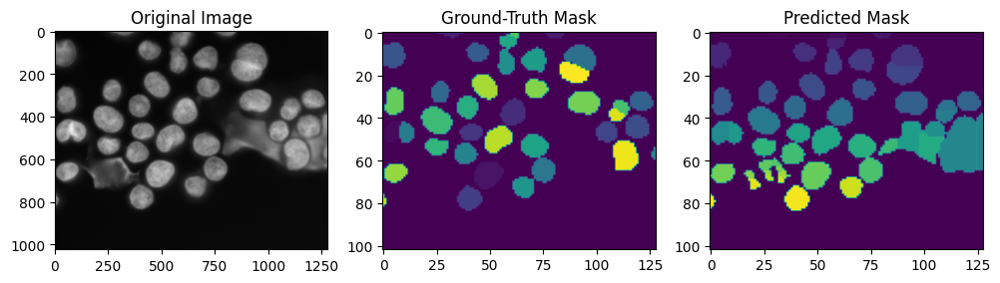

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


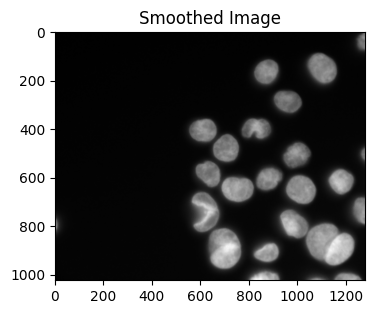

Minimum pixel value: 16
Maximum pixel value: 236


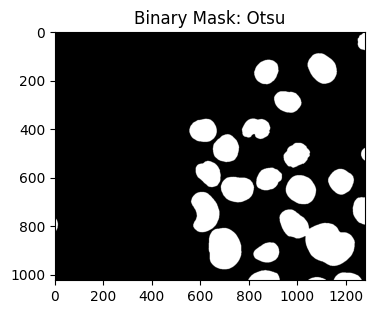

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


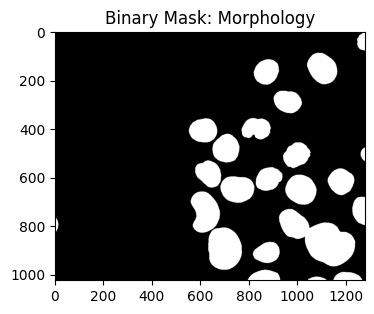

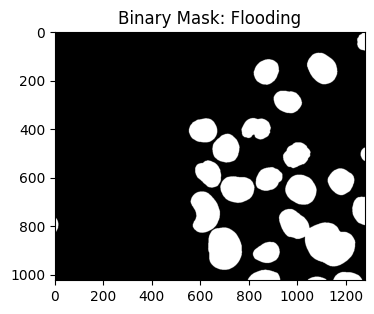

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


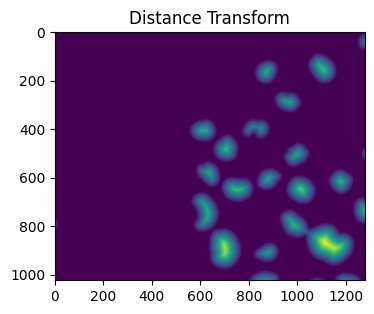

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 77.38862965578342
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 5, IoU=0.9096971633227855
Image 5, IoU=0.9096971633227855


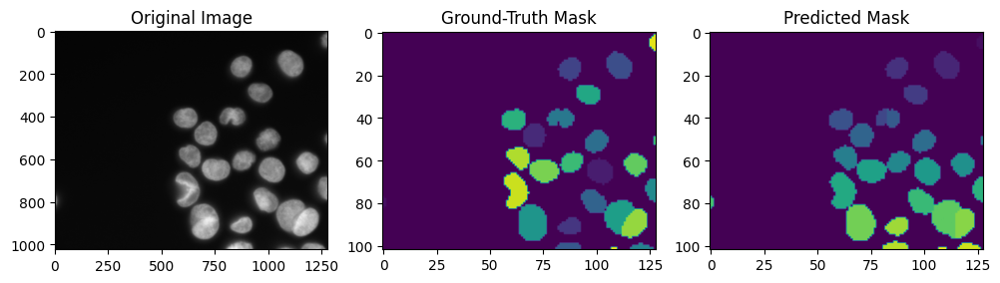

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


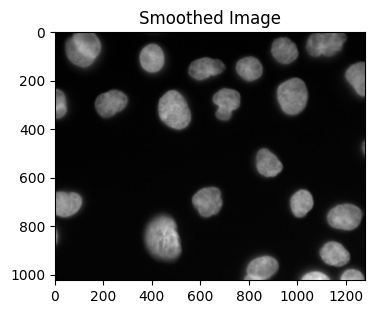

Minimum pixel value: 11
Maximum pixel value: 135


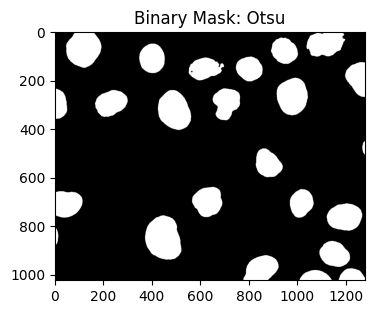

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


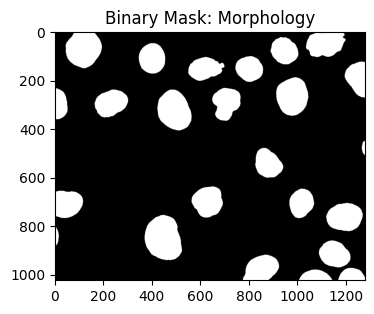

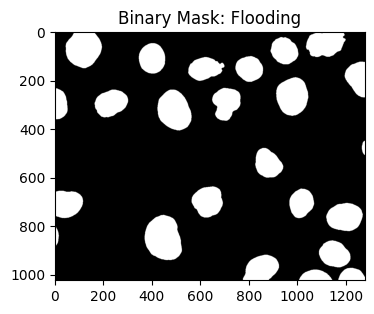

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


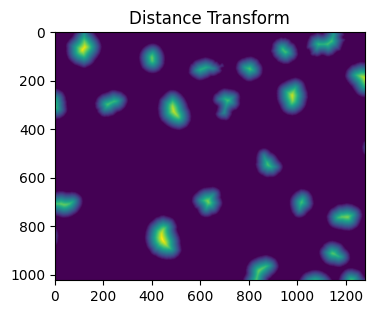

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 71.47027354082255
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 6, IoU=0.8539012870719683
Image 6, IoU=0.8539012870719683


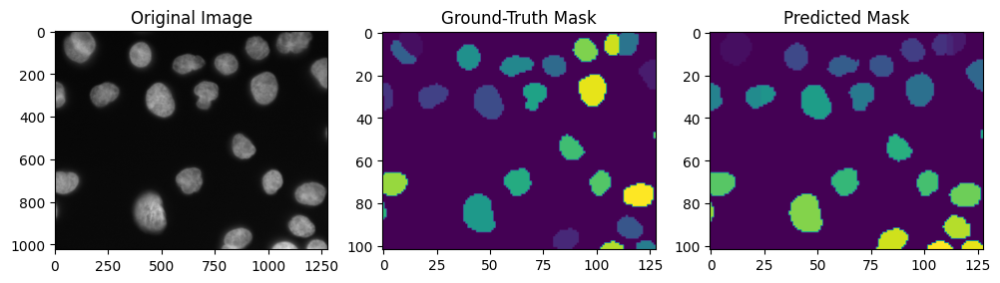

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


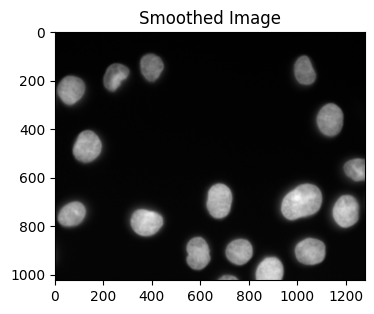

Minimum pixel value: 14
Maximum pixel value: 213


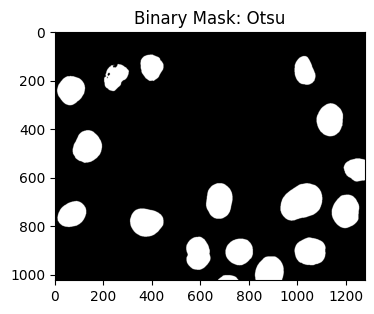

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


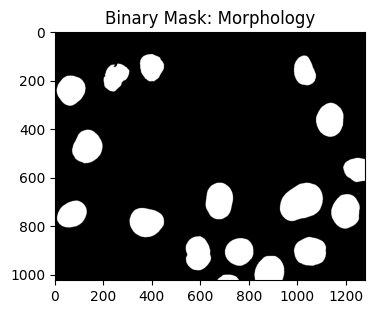

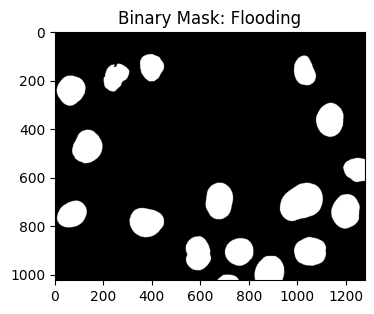

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


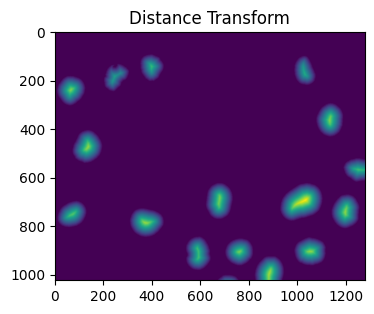

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 69.26037828369117
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 7, IoU=0.9193849387941178
Image 7, IoU=0.9193849387941178


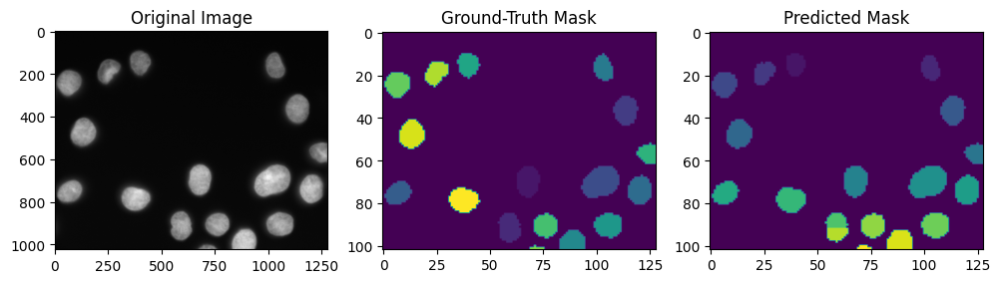

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


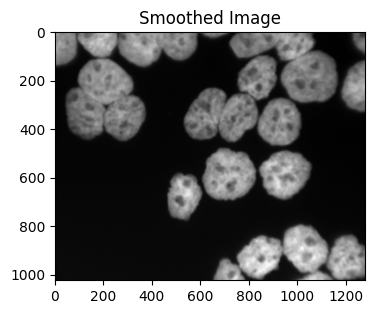

Minimum pixel value: 22
Maximum pixel value: 200


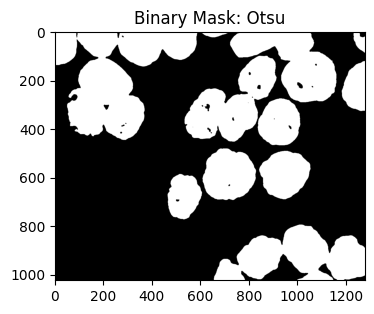

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


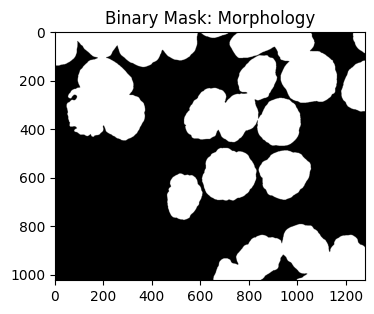

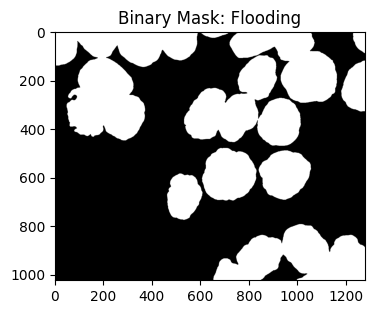

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


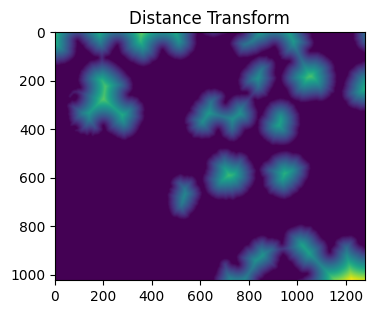

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 145.7737973711325
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 8, IoU=0.8193382228131756
Image 8, IoU=0.8193382228131756


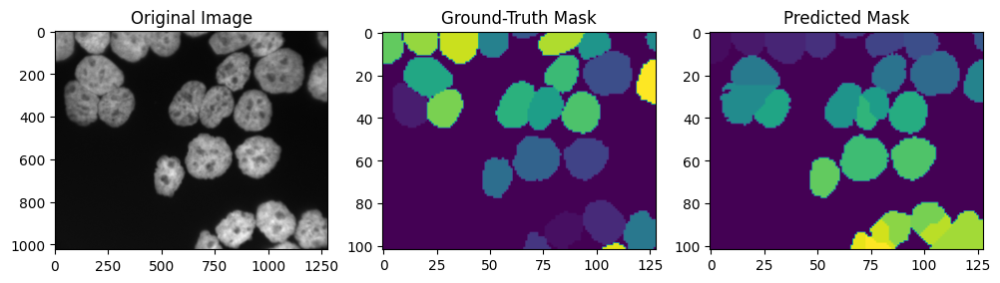

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


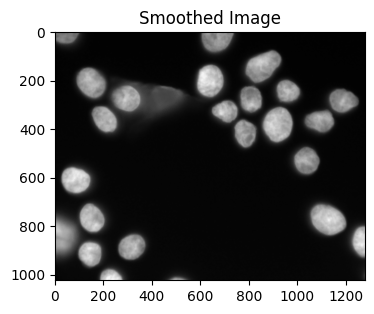

Minimum pixel value: 14
Maximum pixel value: 189


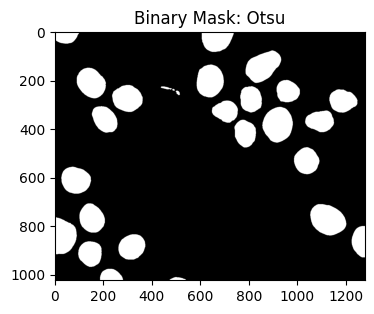

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


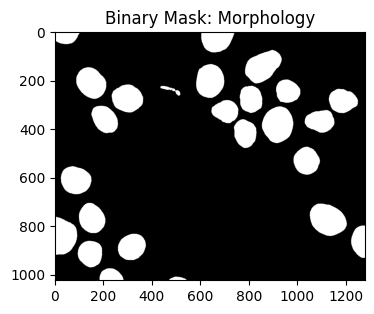

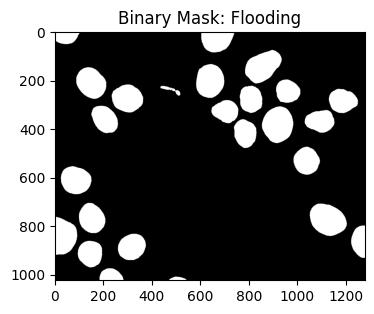

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


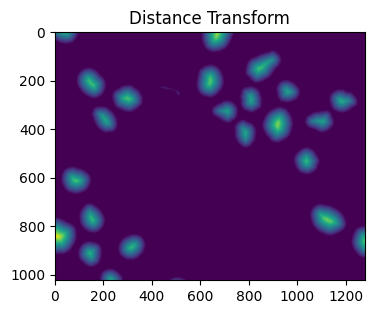

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 76.90253571892151
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 9, IoU=0.9218877971583147
Image 9, IoU=0.9218877971583147


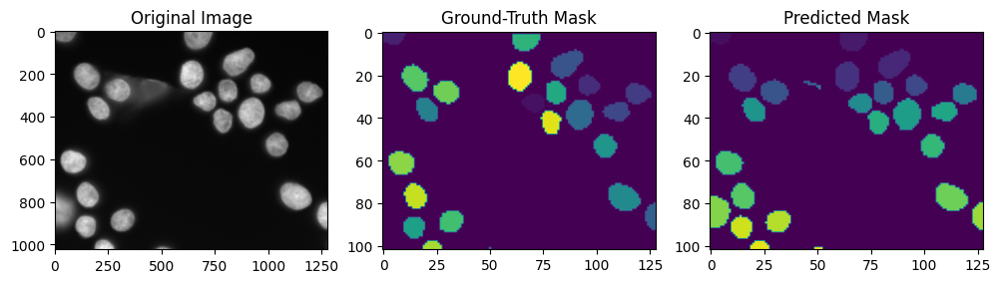

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


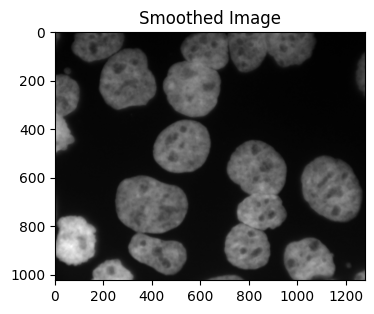

Minimum pixel value: 14
Maximum pixel value: 215


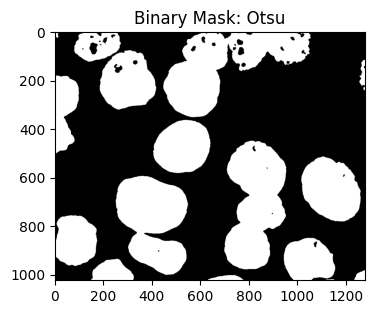

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


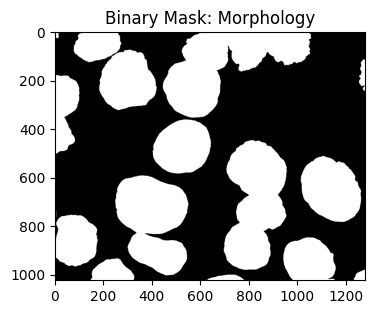

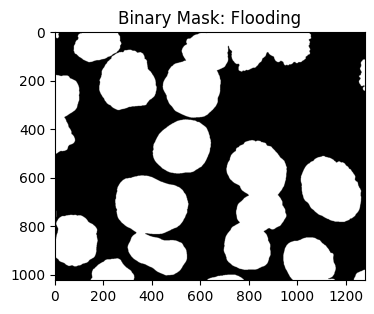

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


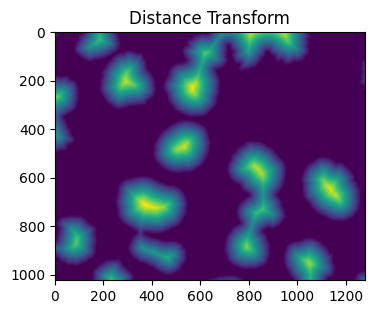

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 114.82595525402782
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 10, IoU=0.8463896936574726
Image 10, IoU=0.8463896936574726


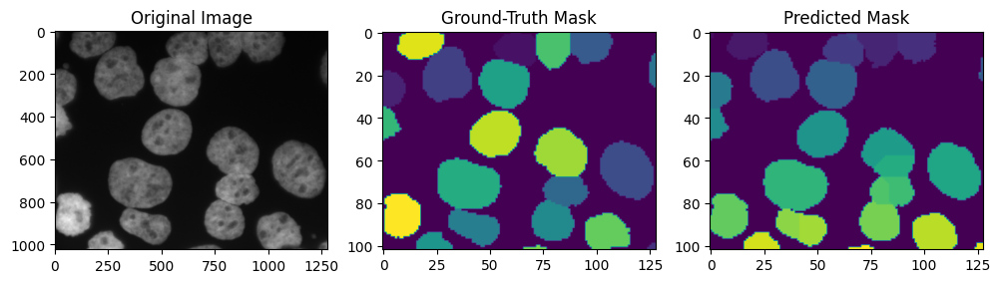

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


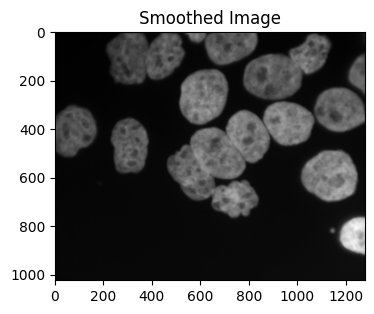

Minimum pixel value: 14
Maximum pixel value: 222


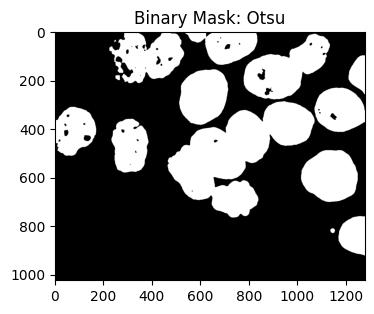

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


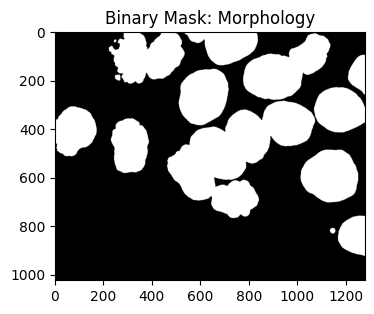

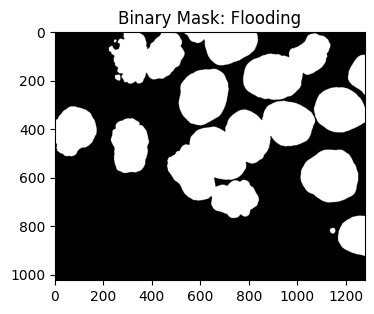

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


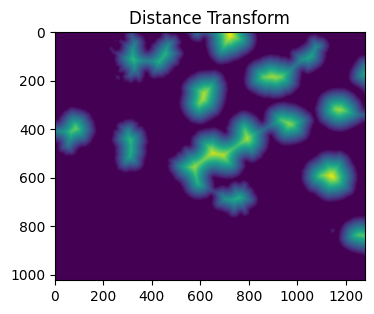

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 109.0
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 11, IoU=0.8199365457627813
Image 11, IoU=0.8199365457627813


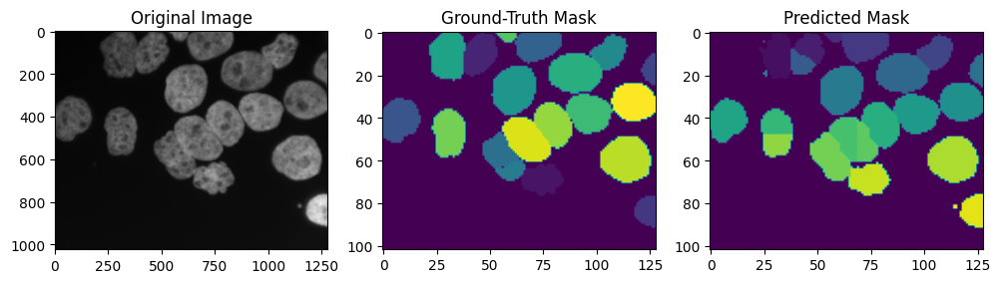

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


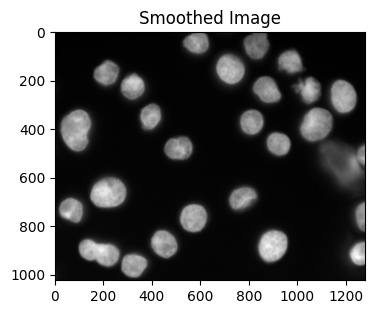

Minimum pixel value: 15
Maximum pixel value: 222


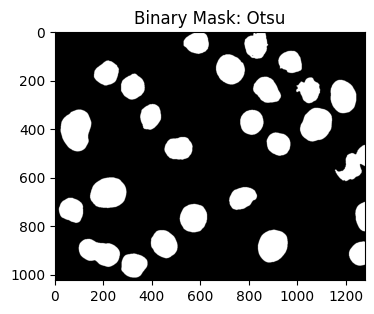

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


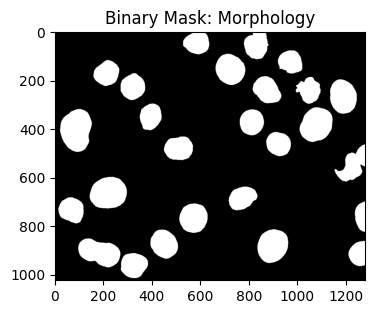

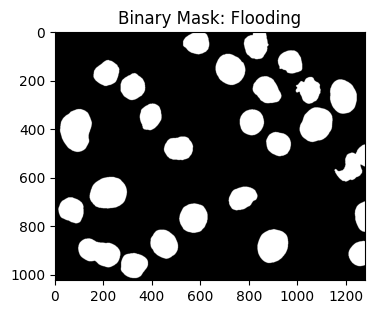

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


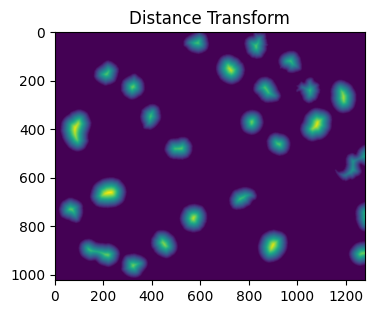

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 64.07027391856539
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 12, IoU=0.9394775019042686
Image 12, IoU=0.9394775019042686


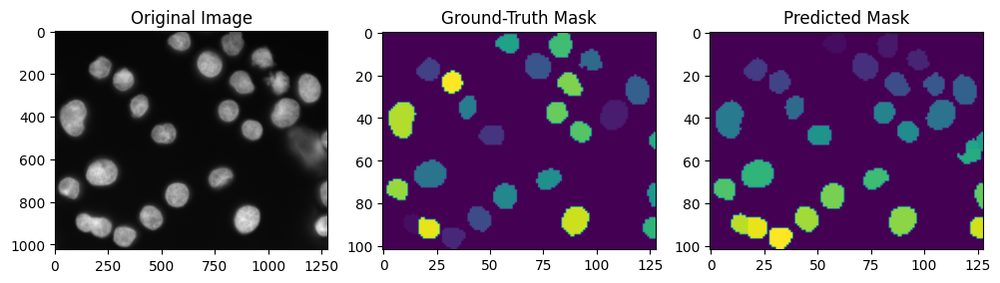

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


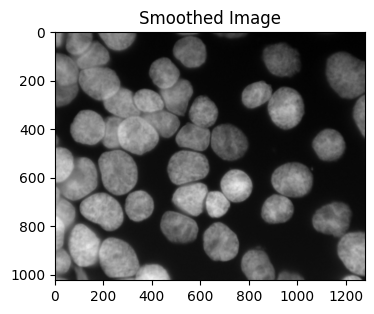

Minimum pixel value: 32
Maximum pixel value: 216


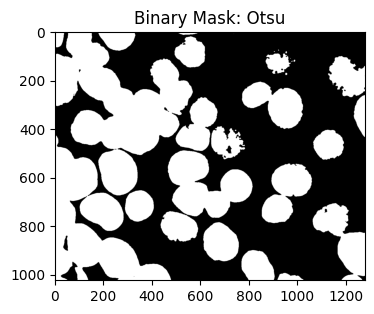

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


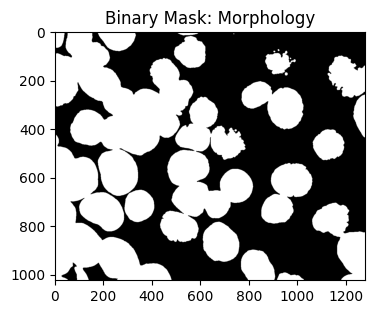

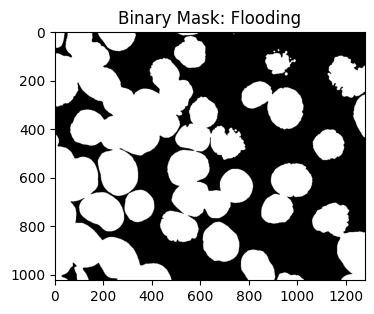

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


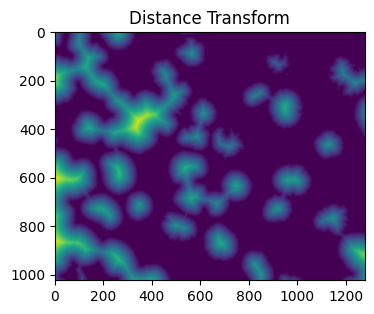

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 115.26057435220423
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 13, IoU=0.6563661092047459
Image 13, IoU=0.6563661092047459


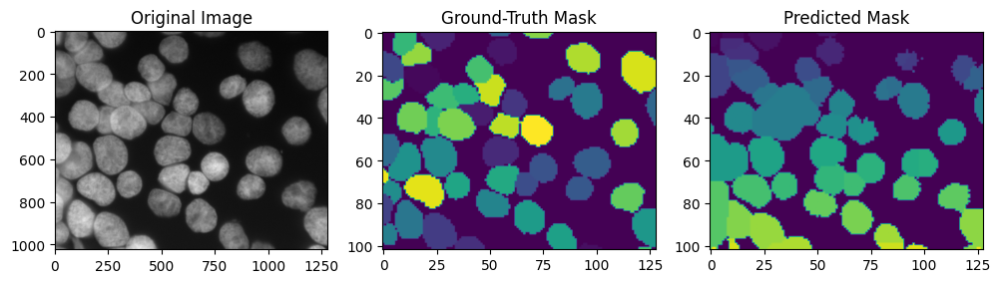

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


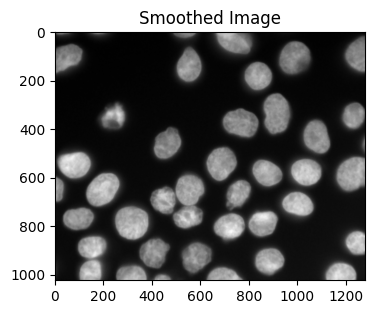

Minimum pixel value: 40
Maximum pixel value: 220


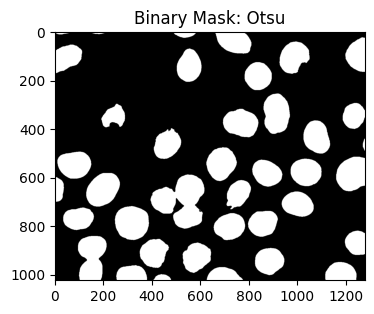

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


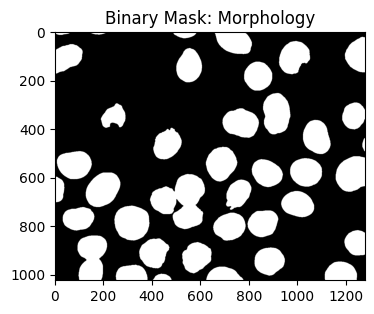

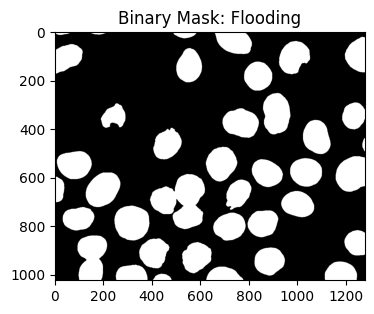

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


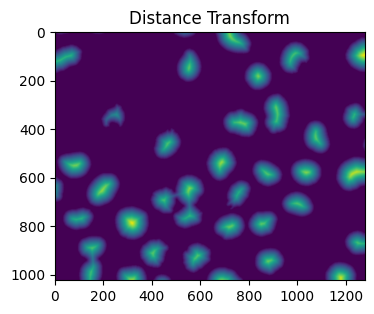

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 71.40028011149536
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 14, IoU=0.8772601101020812
Image 14, IoU=0.8772601101020812


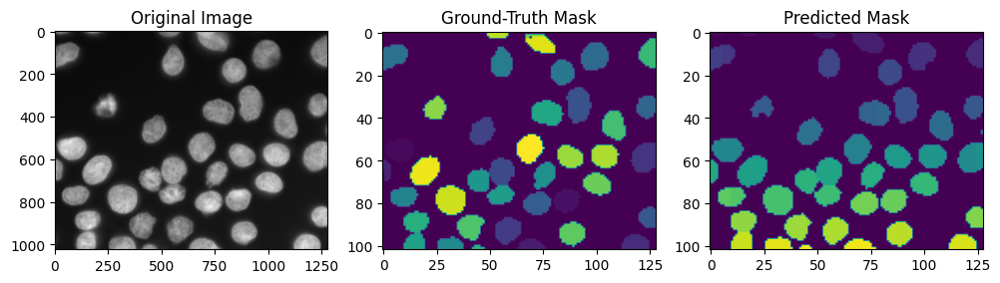

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


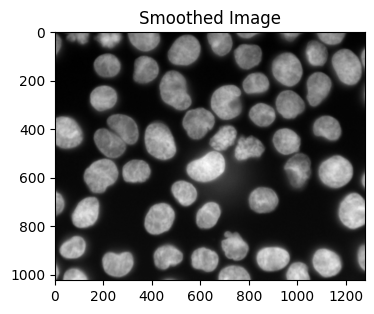

Minimum pixel value: 39
Maximum pixel value: 226


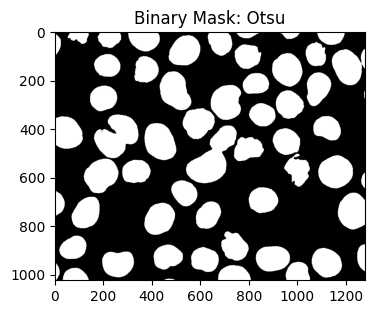

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


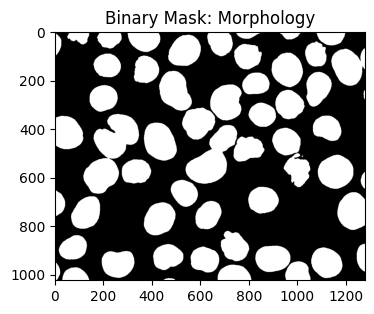

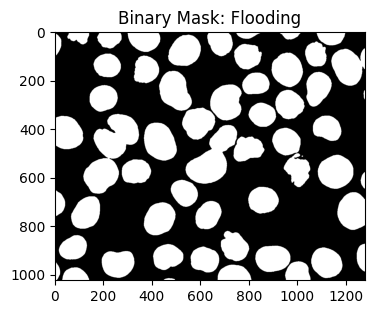

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


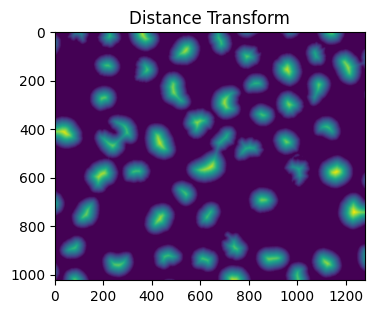

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 68.8839603971781
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 15, IoU=0.9131779632420635
Image 15, IoU=0.9131779632420635


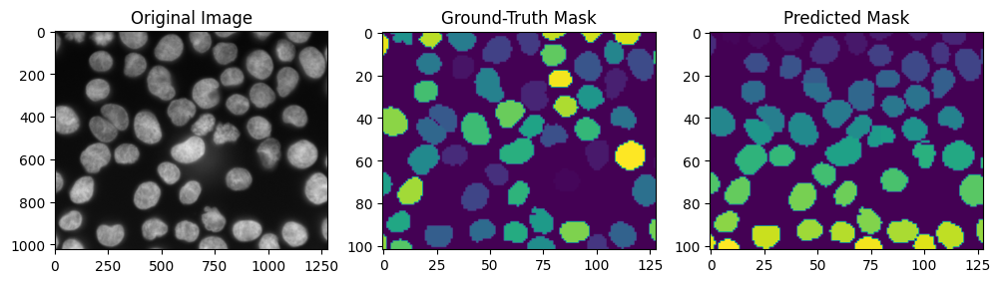

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


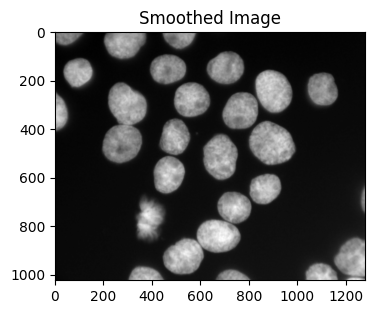

Minimum pixel value: 31
Maximum pixel value: 190


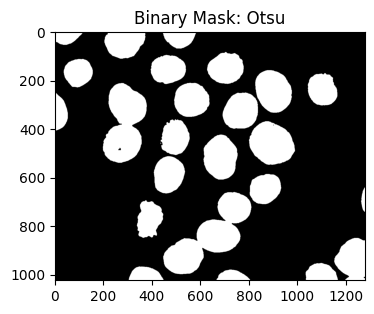

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


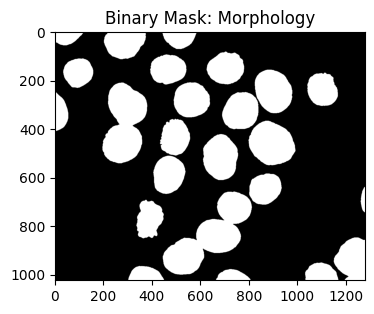

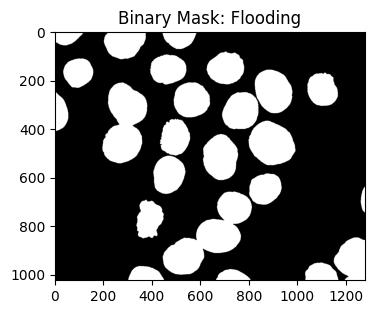

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


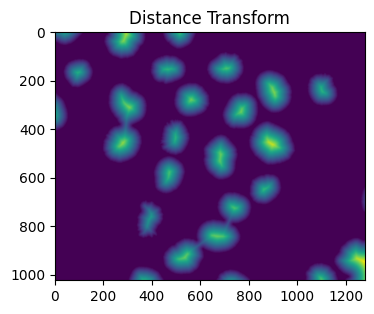

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 90.68627239003708
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 16, IoU=0.8830955707994098
Image 16, IoU=0.8830955707994098


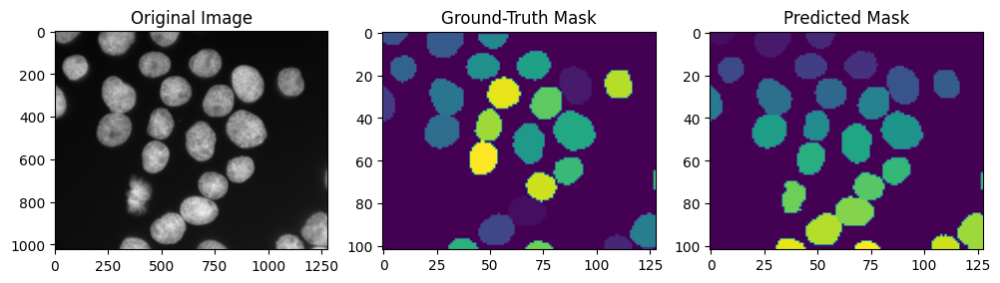

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


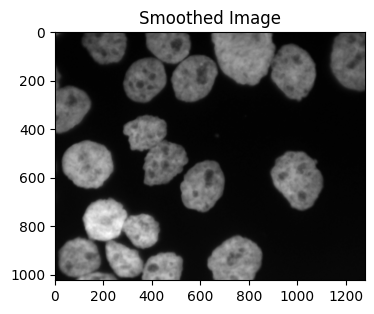

Minimum pixel value: 19
Maximum pixel value: 199


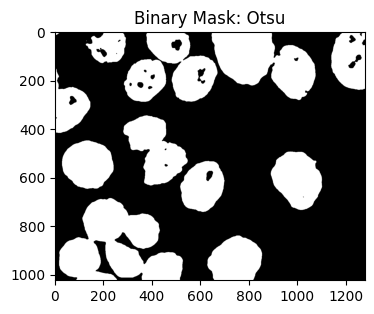

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


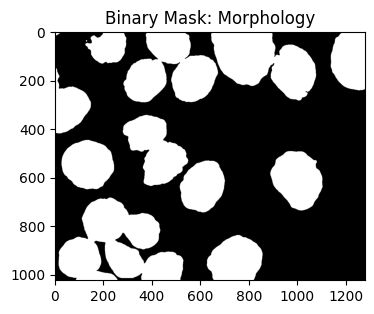

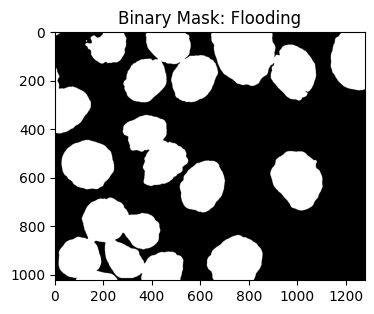

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


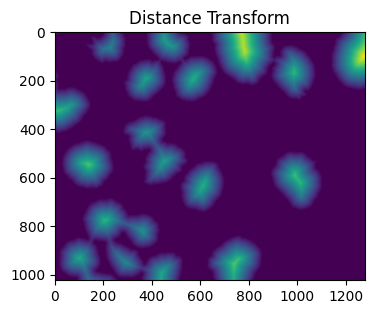

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 136.13228860193308
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 17, IoU=0.8744714768534187
Image 17, IoU=0.8744714768534187


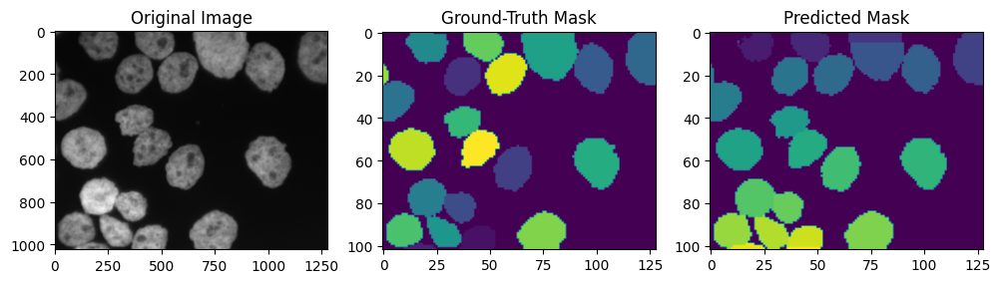

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


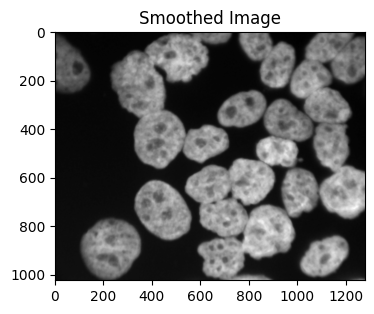

Minimum pixel value: 23
Maximum pixel value: 170


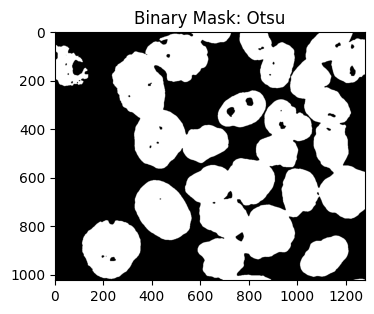

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


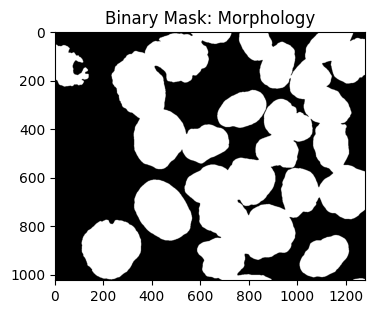

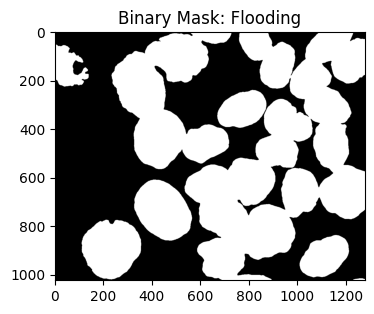

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


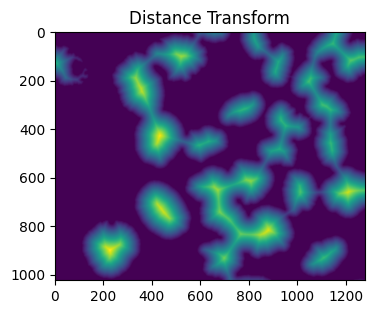

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 107.22872749408155
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 18, IoU=0.8384741735422507
Image 18, IoU=0.8384741735422507


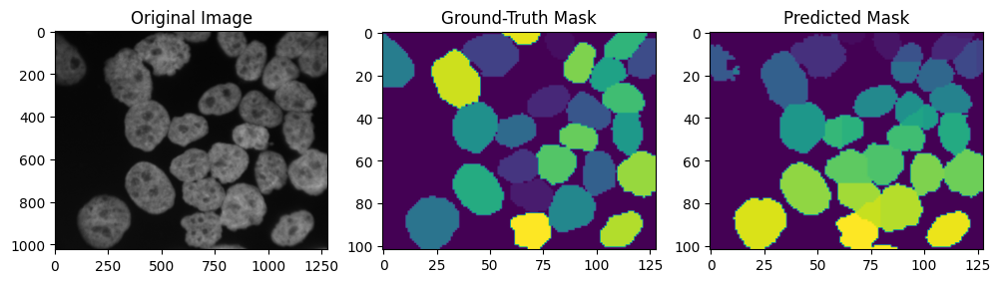

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


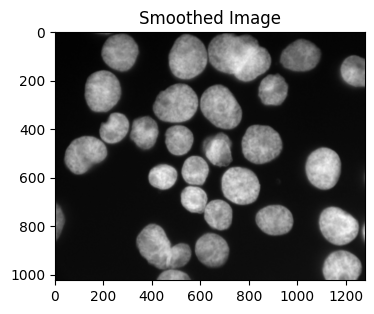

Minimum pixel value: 30
Maximum pixel value: 225


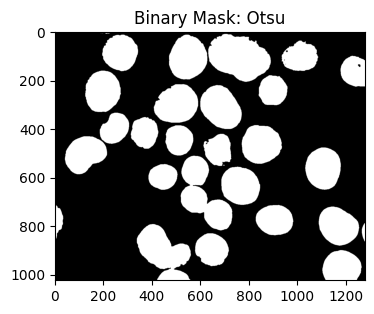

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


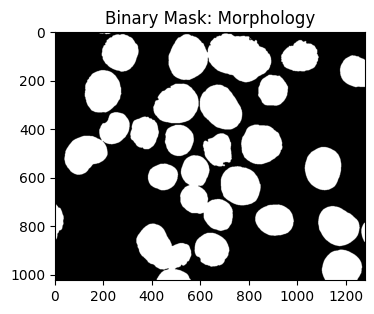

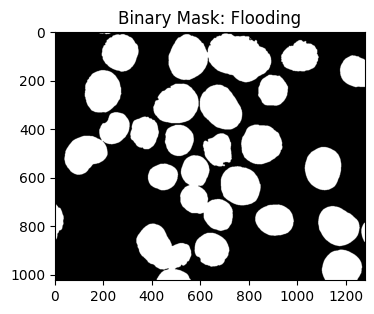

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


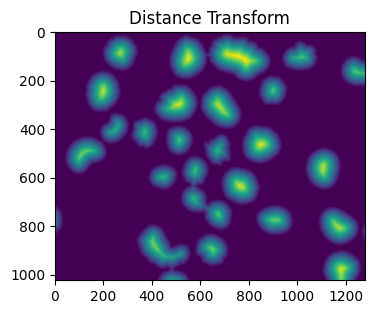

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 81.60882305241266
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 19, IoU=0.897492916202665
Image 19, IoU=0.897492916202665


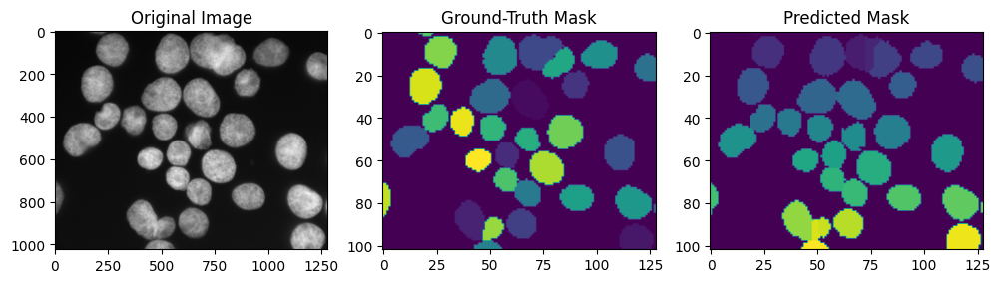

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


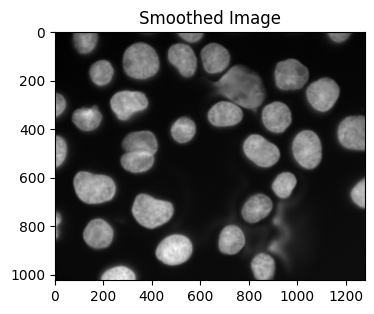

Minimum pixel value: 26
Maximum pixel value: 210


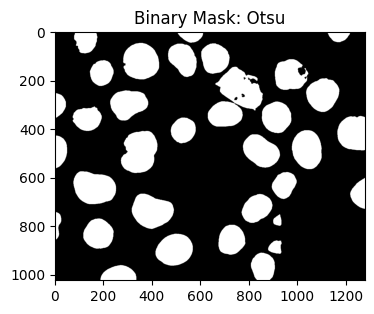

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


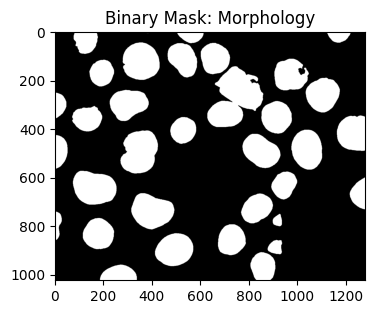

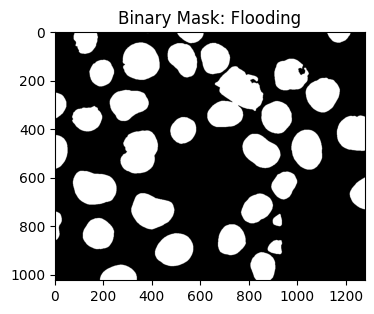

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


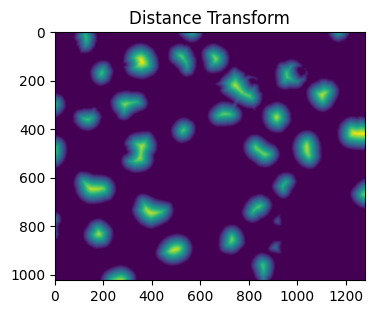

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 71.06335201775947
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 20, IoU=0.936559186686756
Image 20, IoU=0.936559186686756


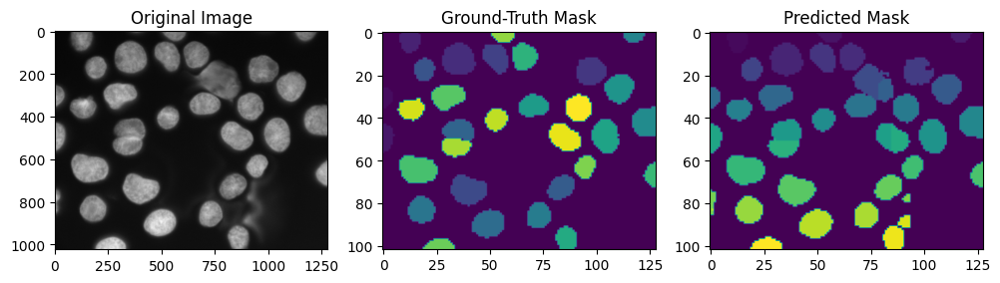

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


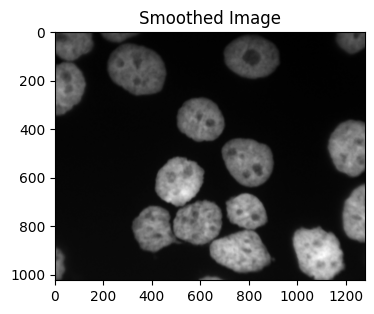

Minimum pixel value: 19
Maximum pixel value: 216


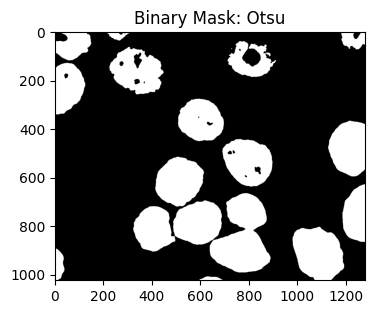

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


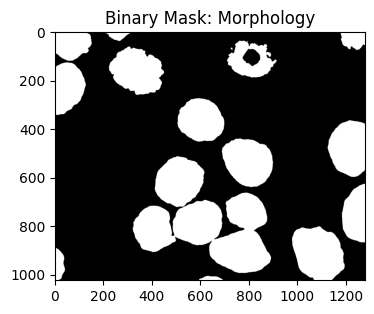

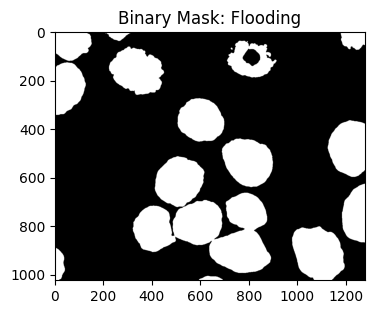

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


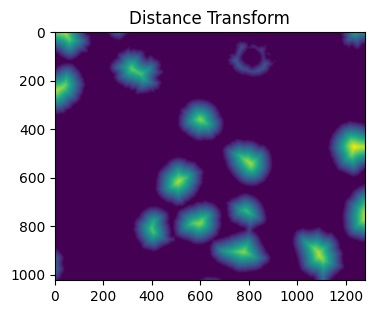

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 105.22357150372724
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 21, IoU=0.8752244711978837
Image 21, IoU=0.8752244711978837


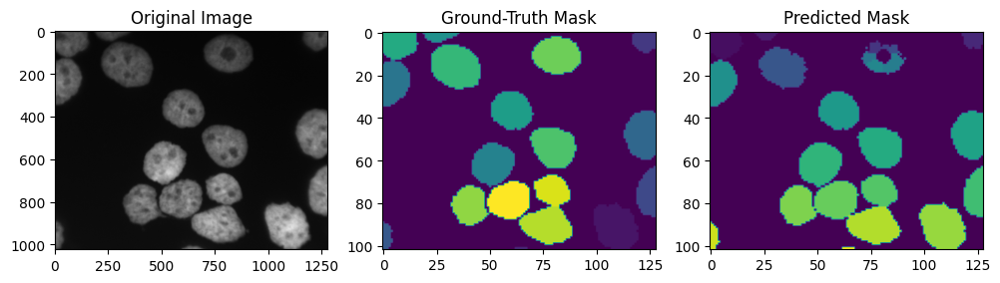

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


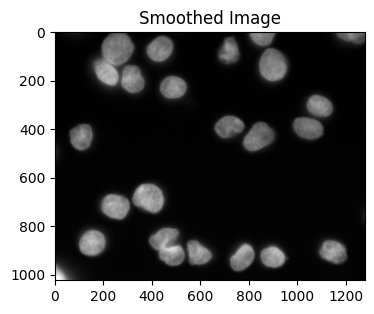

Minimum pixel value: 12
Maximum pixel value: 245


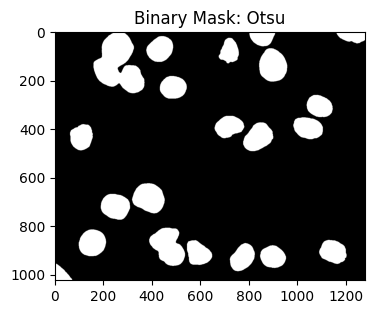

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


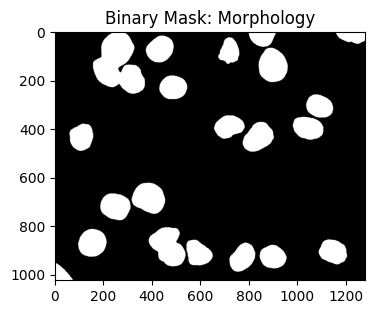

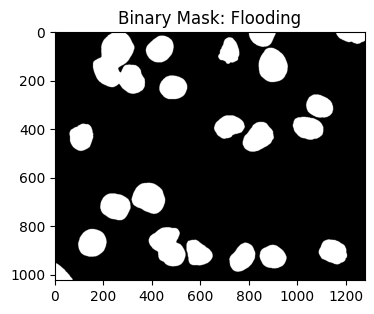

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


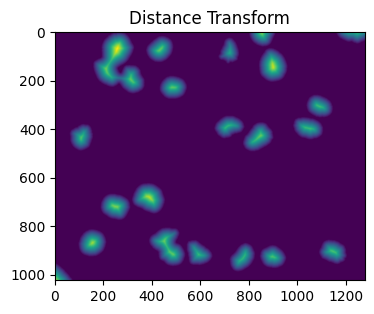

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 64.66065264130884
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 22, IoU=0.9358679202449637
Image 22, IoU=0.9358679202449637


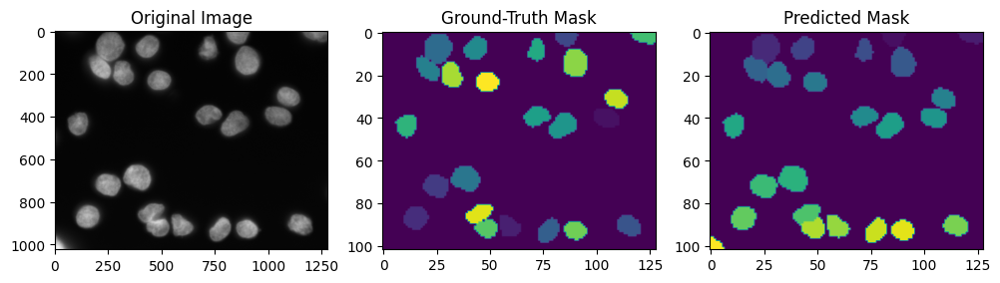

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


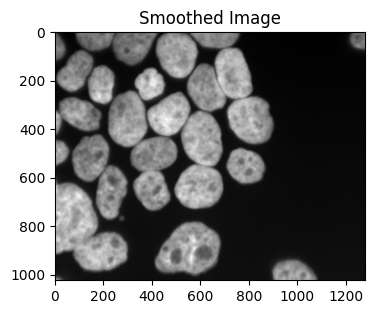

Minimum pixel value: 35
Maximum pixel value: 199


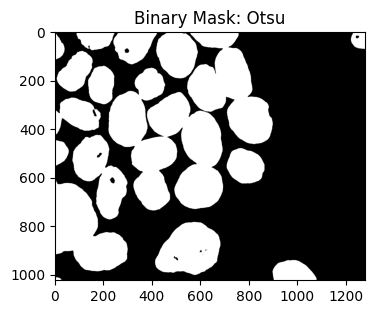

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


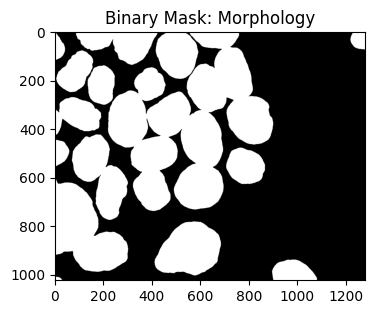

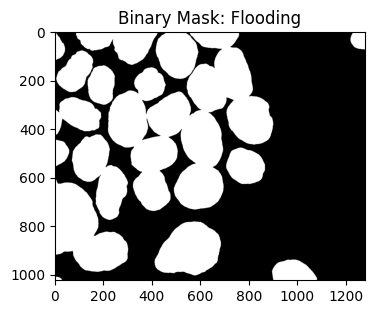

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


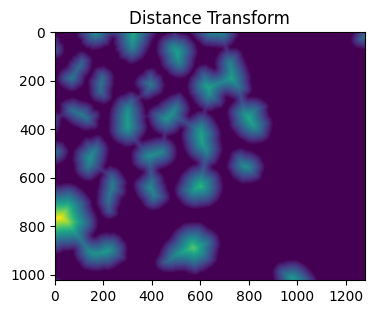

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 142.59382875847047
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 23, IoU=0.8890780005472086
Image 23, IoU=0.8890780005472086


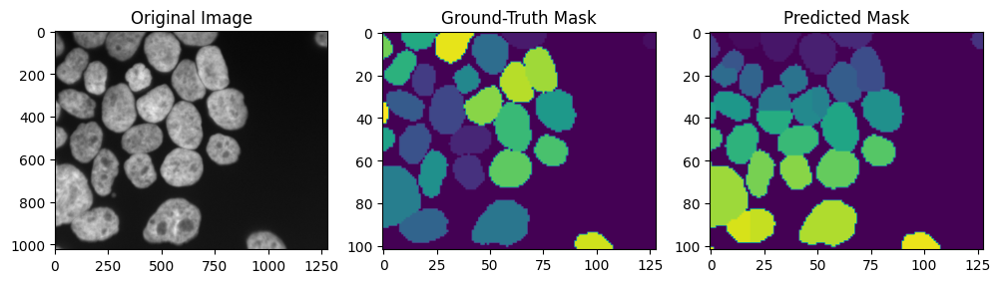

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


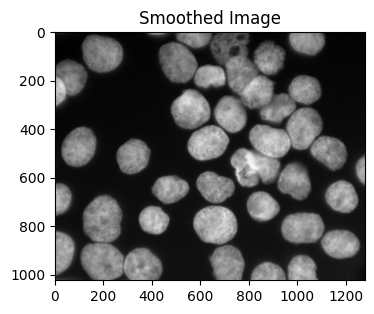

Minimum pixel value: 43
Maximum pixel value: 246


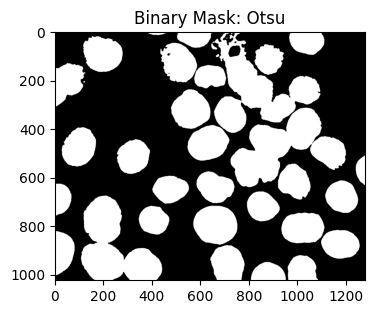

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


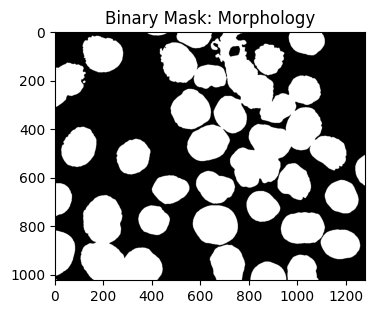

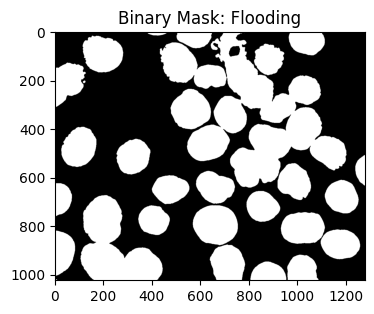

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


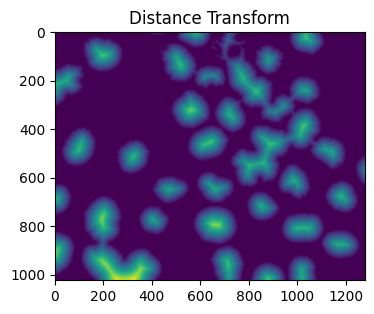

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 97.30878685915265
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 24, IoU=0.8555491320159947
Image 24, IoU=0.8555491320159947


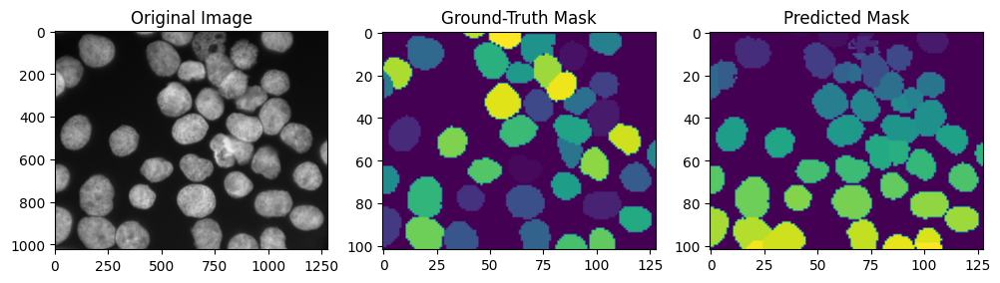

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


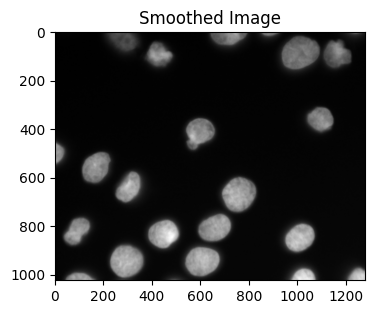

Minimum pixel value: 16
Maximum pixel value: 220


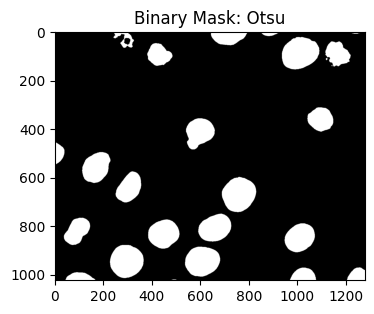

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


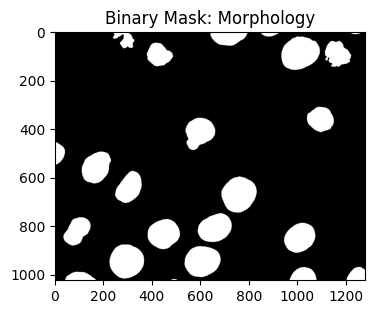

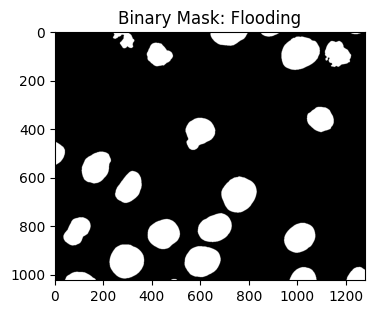

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


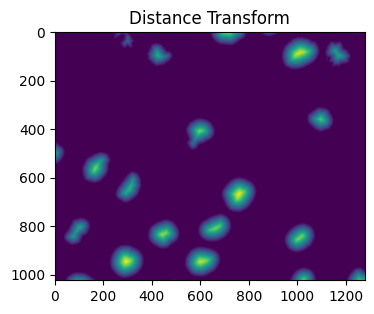

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 67.62396025078685
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 25, IoU=0.8858597054333132
Image 25, IoU=0.8858597054333132


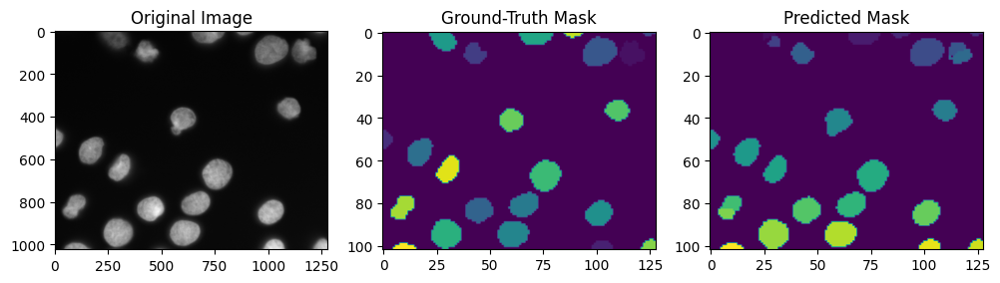

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


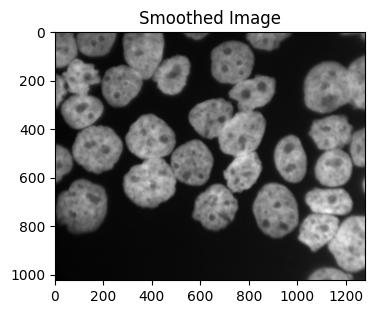

Minimum pixel value: 26
Maximum pixel value: 210


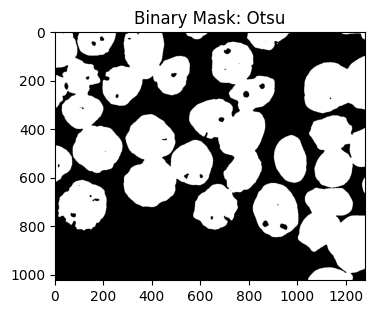

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


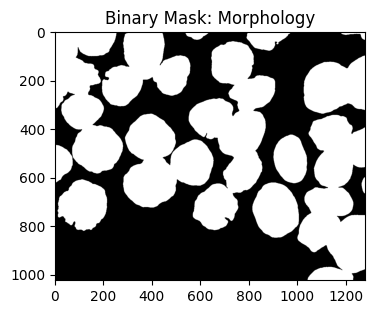

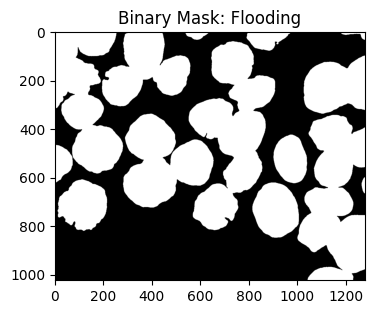

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


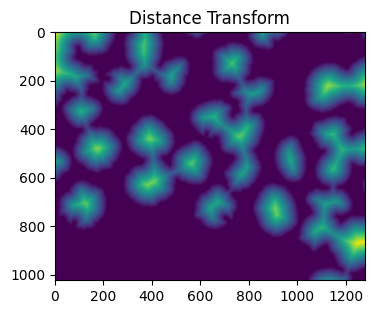

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 115.43396380615195
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 26, IoU=0.8529331160533005
Image 26, IoU=0.8529331160533005


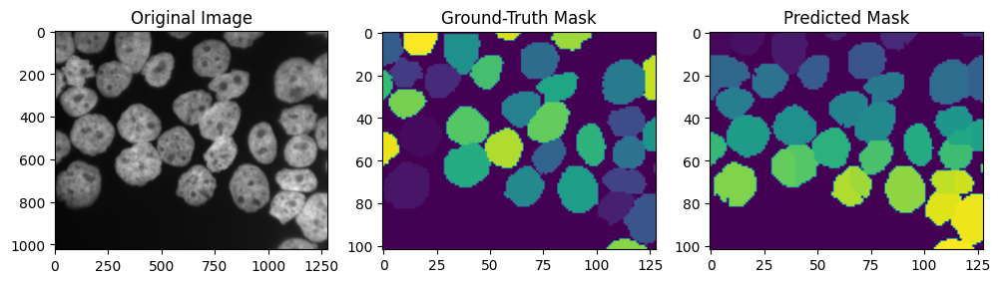

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


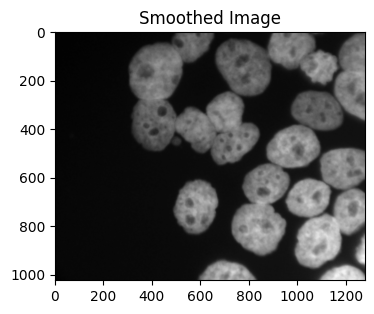

Minimum pixel value: 30
Maximum pixel value: 206


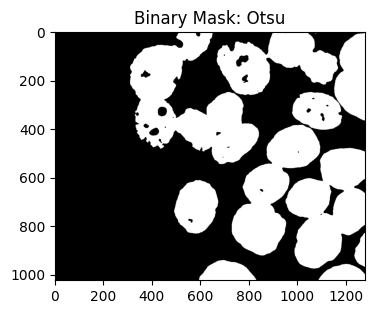

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


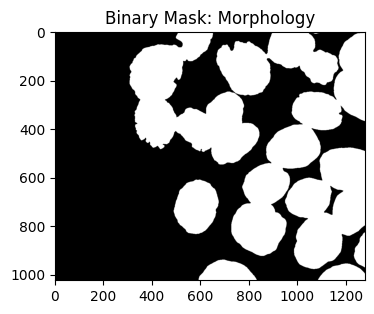

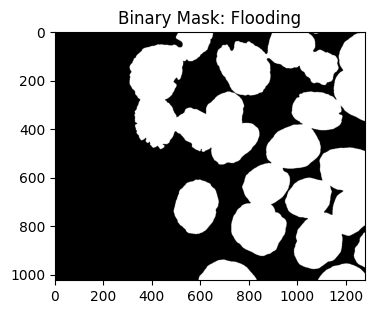

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


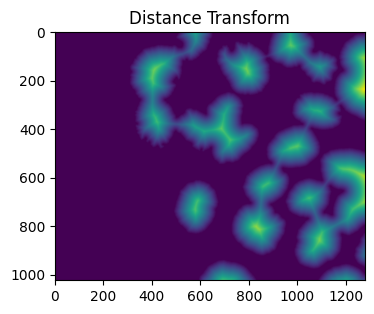

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 118.84864324004712
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 27, IoU=0.8777671512569185
Image 27, IoU=0.8777671512569185


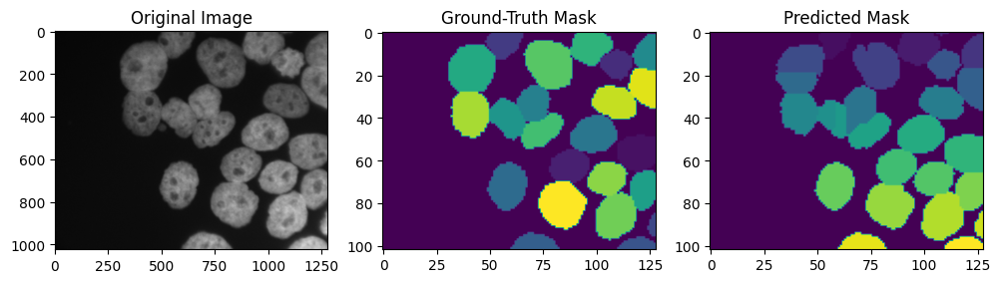

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


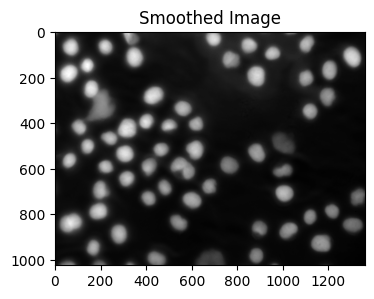

Minimum pixel value: 28
Maximum pixel value: 228


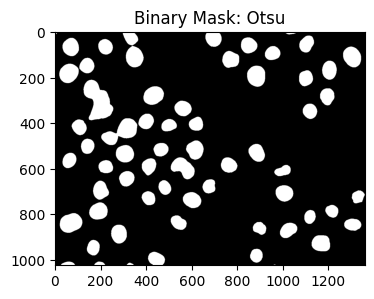

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


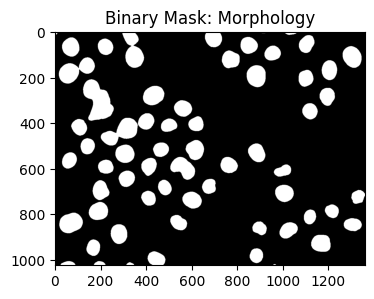

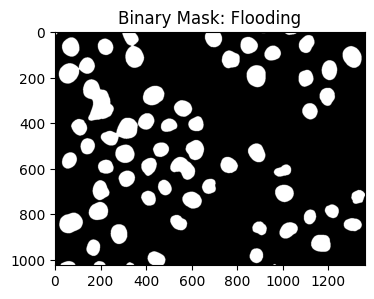

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


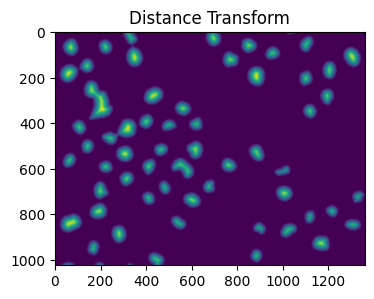

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 43.04648650006177
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 28, IoU=0.8088999851583379
Image 28, IoU=0.8088999851583379


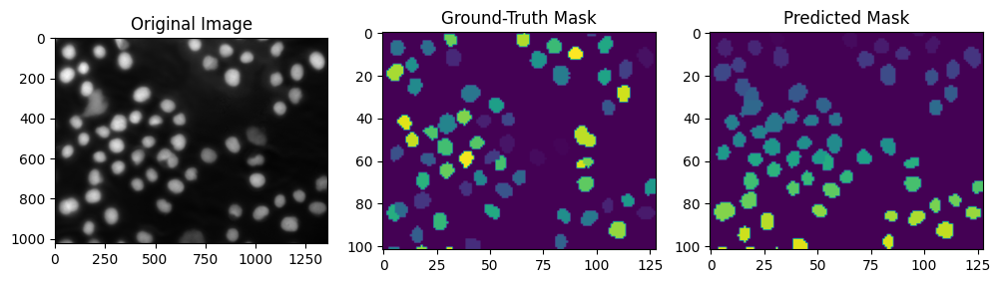

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


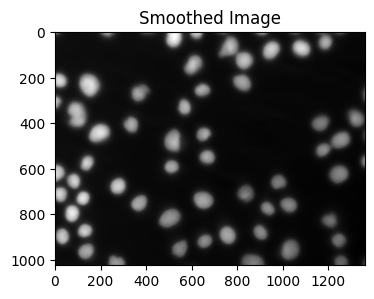

Minimum pixel value: 23
Maximum pixel value: 233


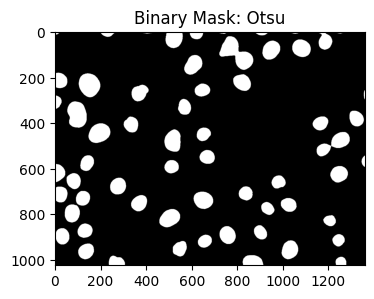

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


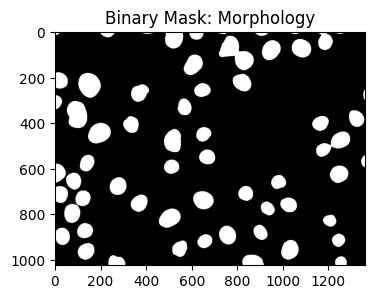

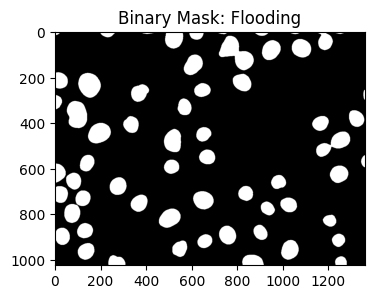

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


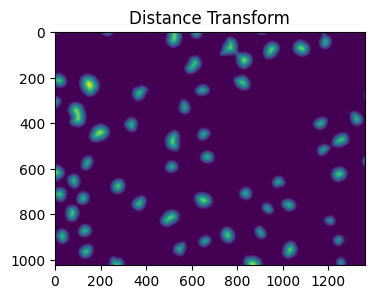

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 47.01063709417264
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 29, IoU=0.7935261657756026
Image 29, IoU=0.7935261657756026


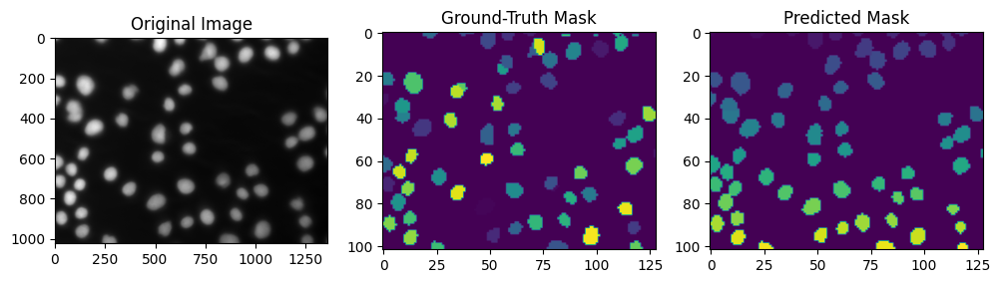

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


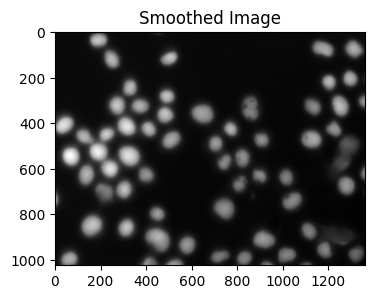

Minimum pixel value: 22
Maximum pixel value: 220


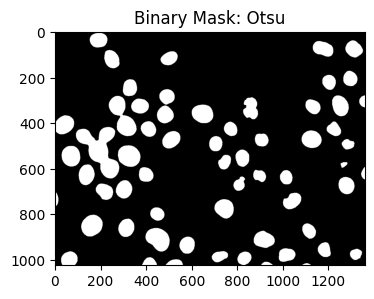

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


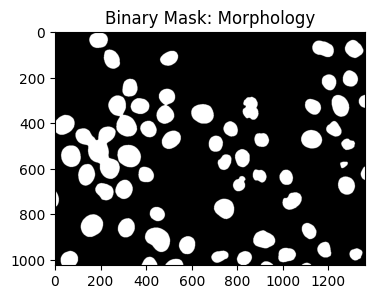

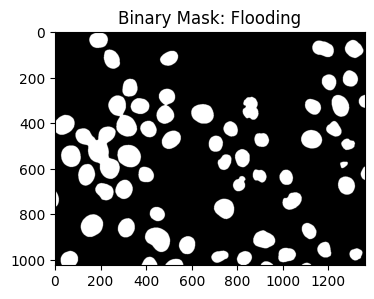

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


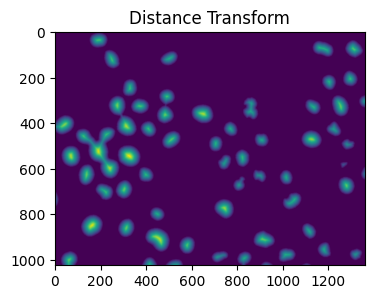

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 47.53945729601885
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 30, IoU=0.8314473472395735
Image 30, IoU=0.8314473472395735


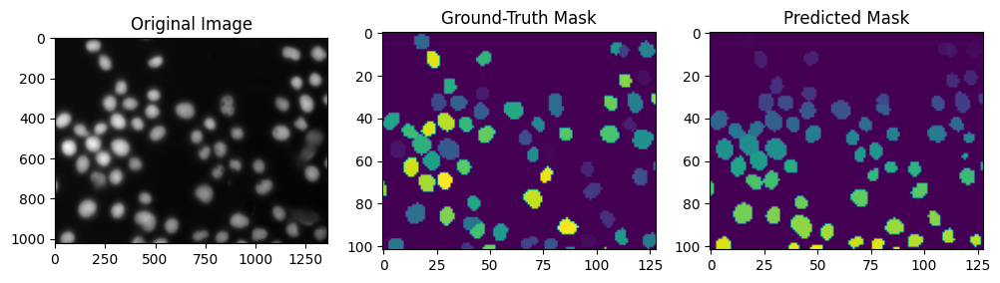

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


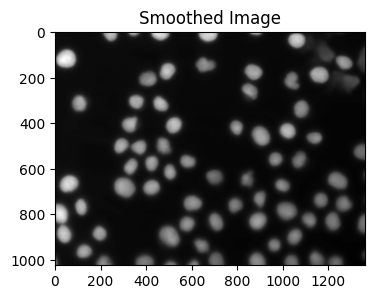

Minimum pixel value: 16
Maximum pixel value: 132


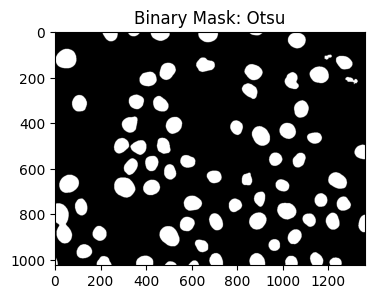

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


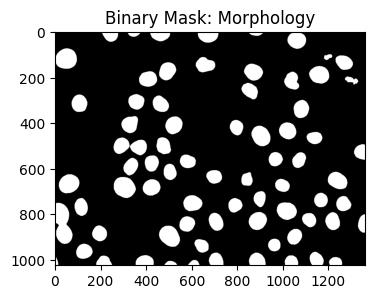

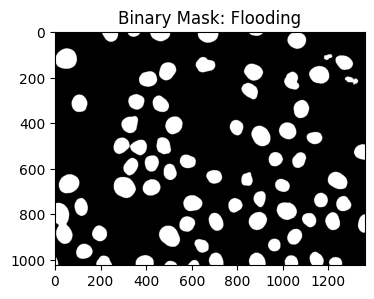

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


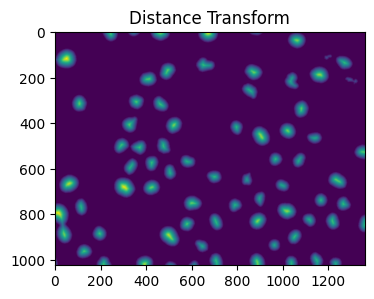

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 44.181444068749045
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 31, IoU=0.845302431419048
Image 31, IoU=0.845302431419048


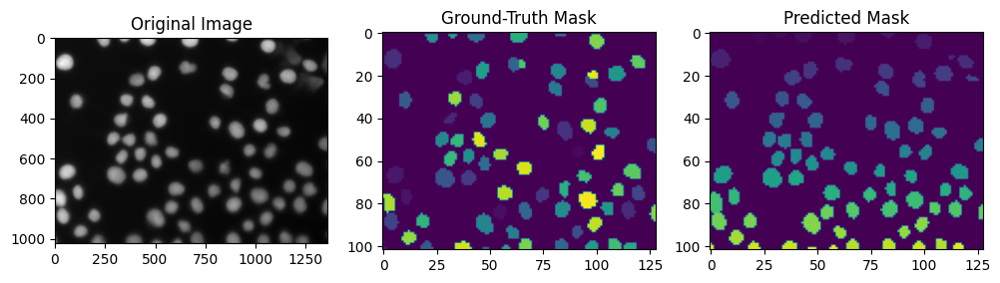

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


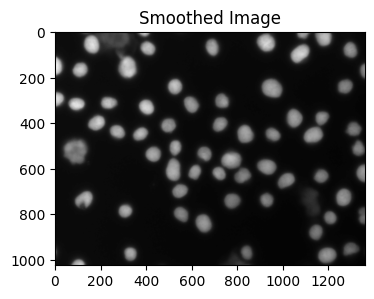

Minimum pixel value: 15
Maximum pixel value: 138


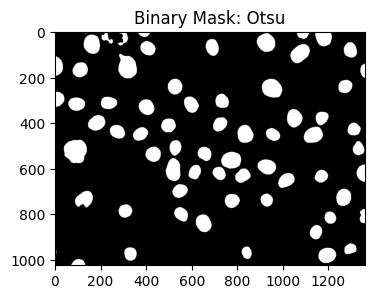

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


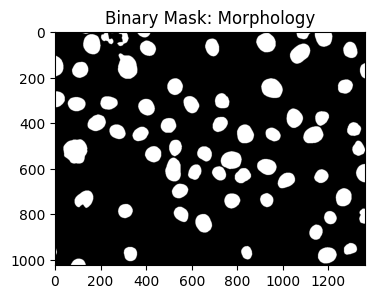

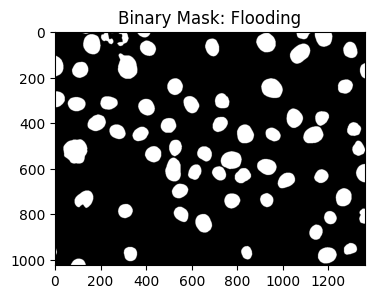

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


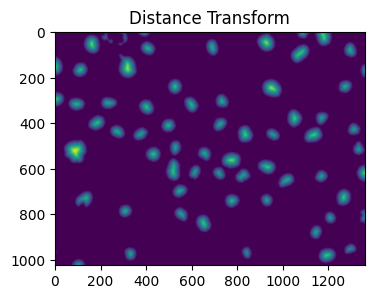

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 48.08326112068523
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 32, IoU=0.8793905133019143
Image 32, IoU=0.8793905133019143


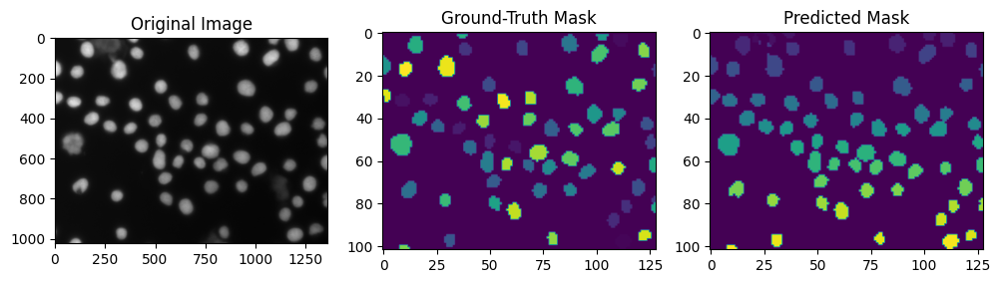

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


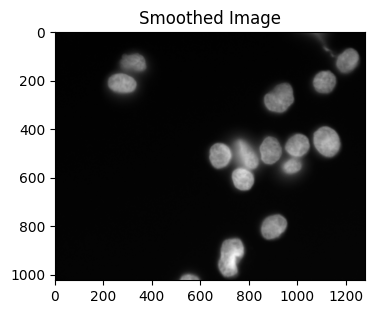

Minimum pixel value: 11
Maximum pixel value: 246


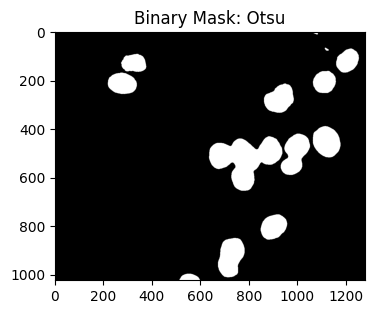

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


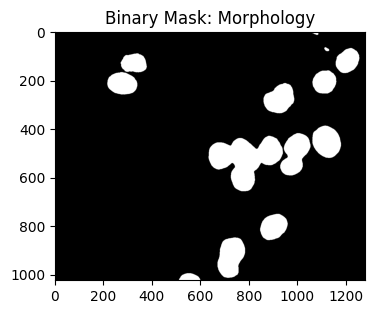

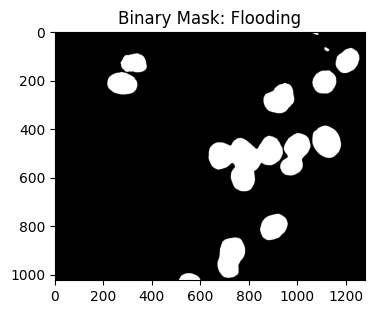

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


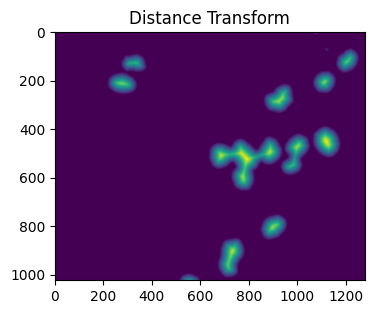

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 56.85068161420758
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 33, IoU=0.8835659518657548
Image 33, IoU=0.8835659518657548


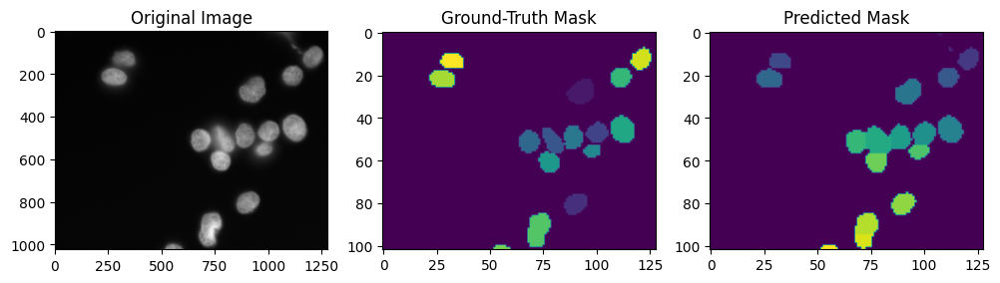

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


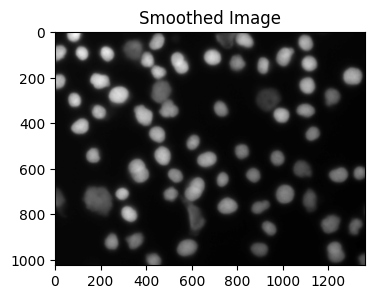

Minimum pixel value: 16
Maximum pixel value: 133


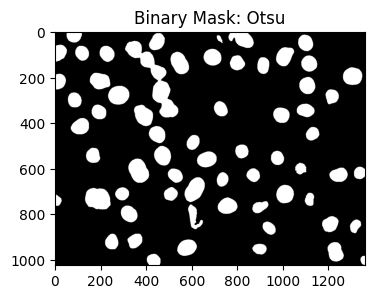

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


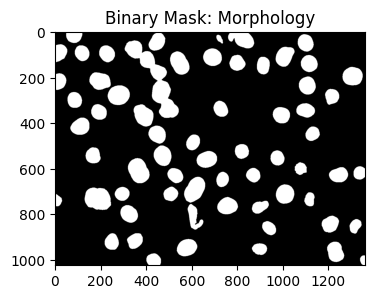

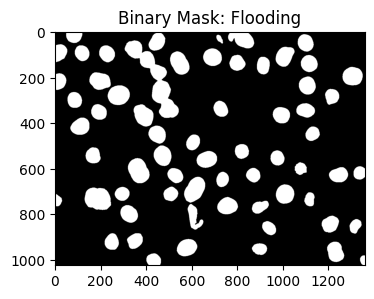

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


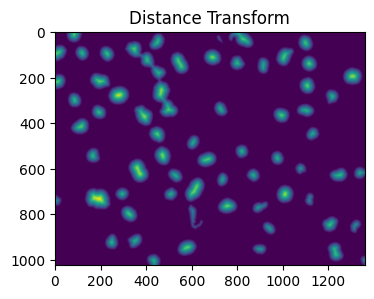

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 46.17358552246078
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 34, IoU=0.8494199669354973
Image 34, IoU=0.8494199669354973


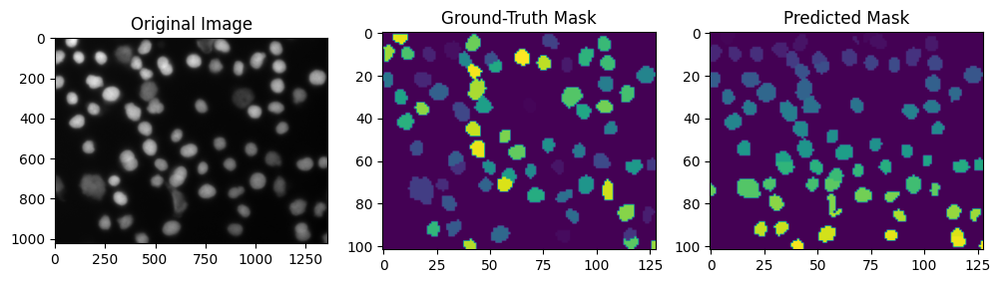

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


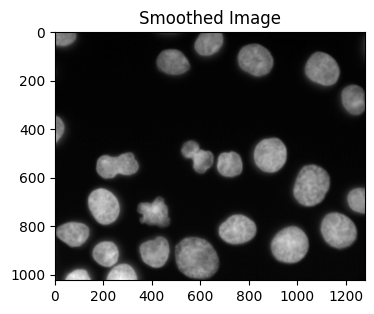

Minimum pixel value: 11
Maximum pixel value: 149


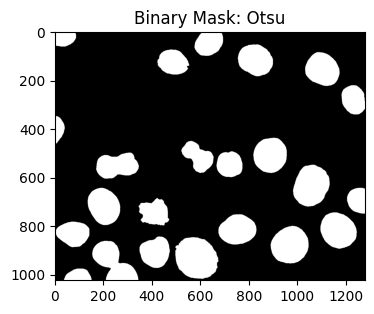

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


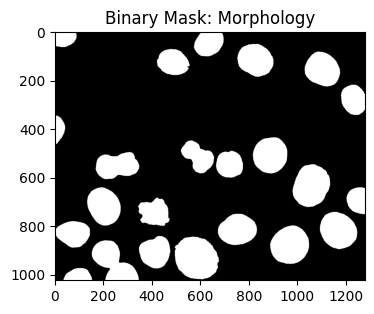

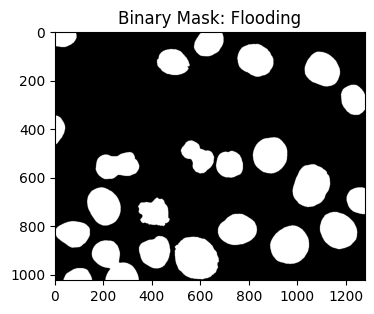

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


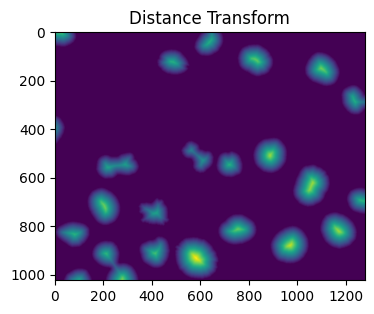

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 82.73451516749222
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 35, IoU=0.8891762647160827
Image 35, IoU=0.8891762647160827


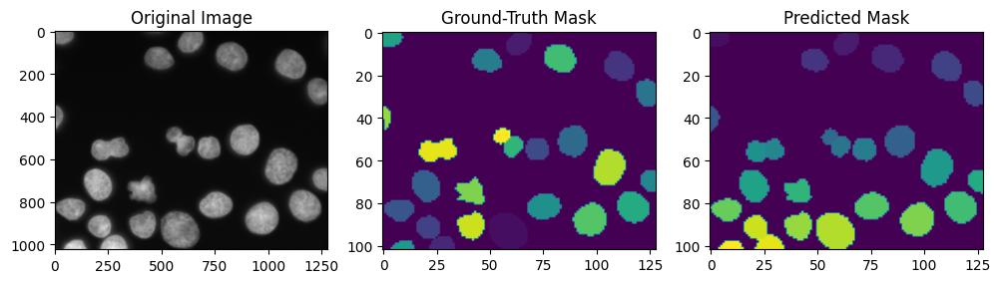

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


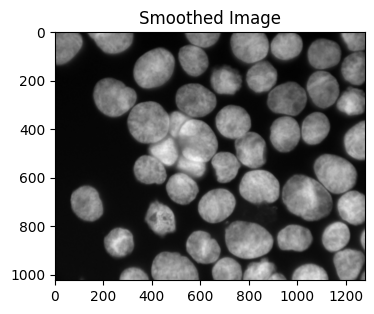

Minimum pixel value: 27
Maximum pixel value: 225


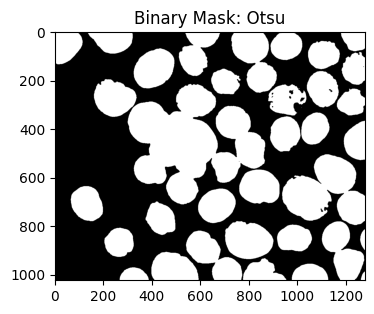

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


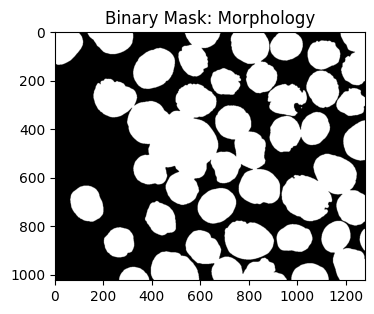

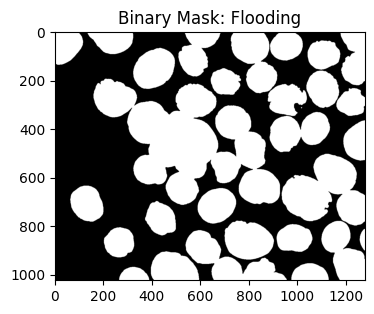

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


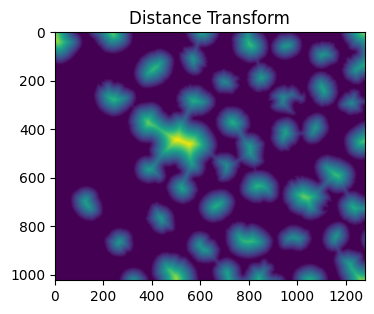

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 109.20164833920778
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 36, IoU=0.8436763664248971
Image 36, IoU=0.8436763664248971


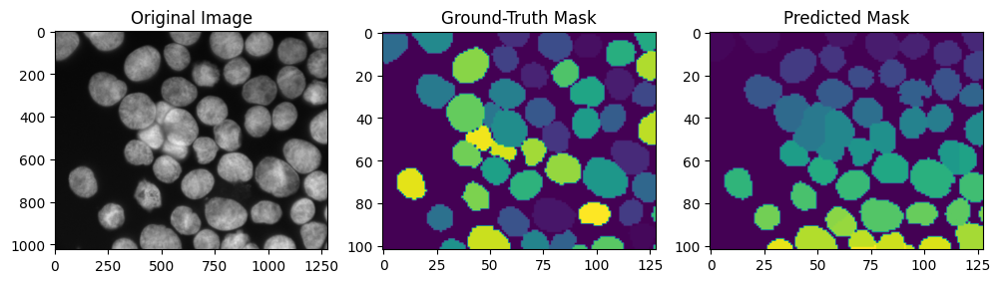

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


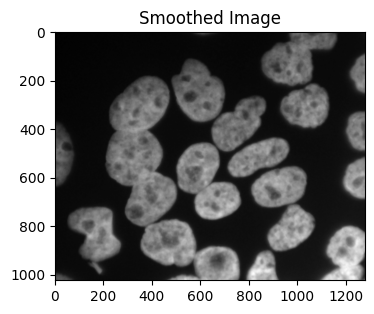

Minimum pixel value: 31
Maximum pixel value: 183


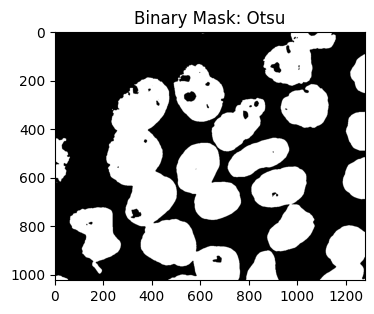

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


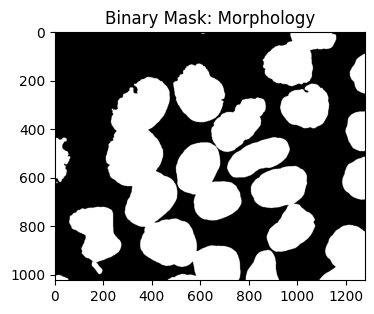

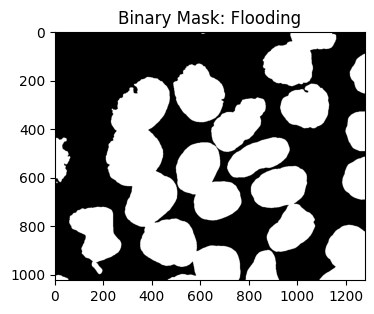

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


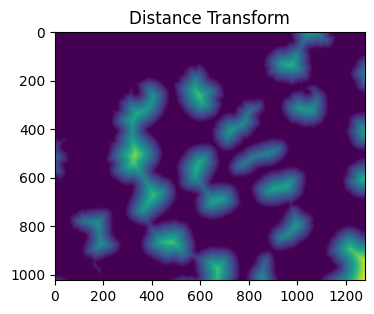

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 132.5028301584536
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 37, IoU=0.7477602970787329
Image 37, IoU=0.7477602970787329


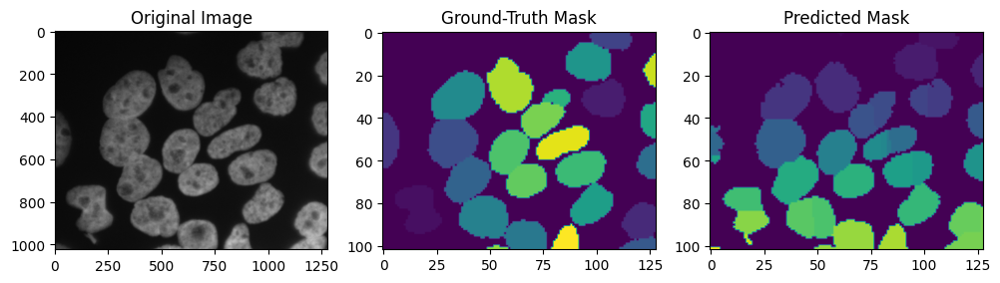

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


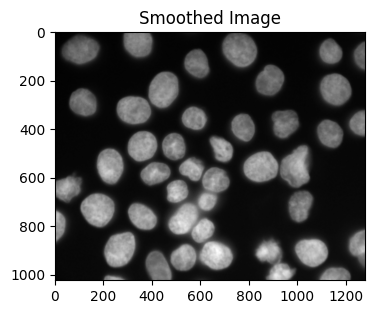

Minimum pixel value: 17
Maximum pixel value: 186


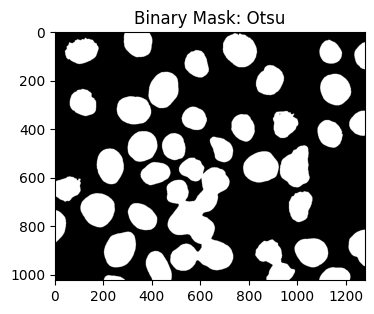

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


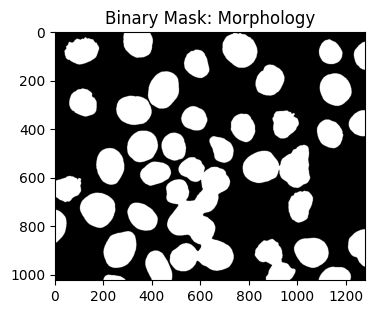

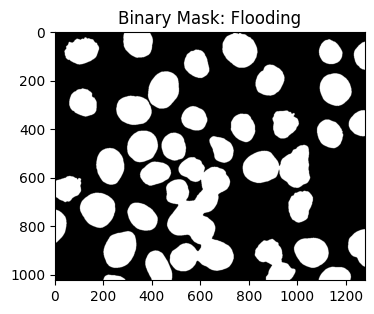

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


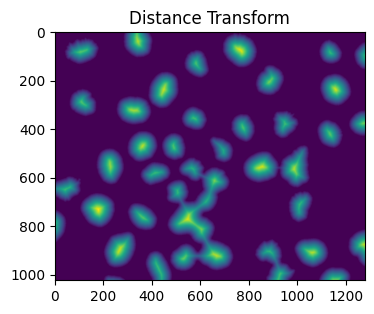

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 67.72001181334805
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 38, IoU=0.8840524591200603
Image 38, IoU=0.8840524591200603


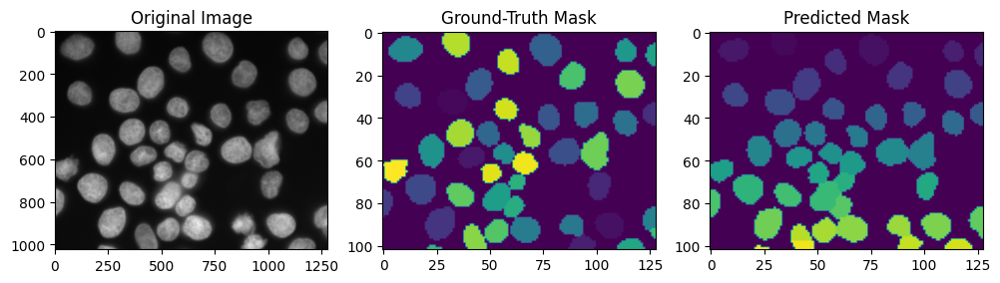

<ipython-input-23-c8dbb7f7b26c>:52: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  image_smoothed = median(image, disk(3))


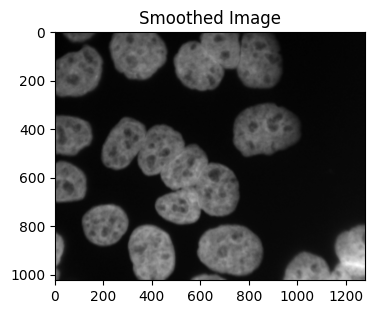

Minimum pixel value: 26
Maximum pixel value: 208


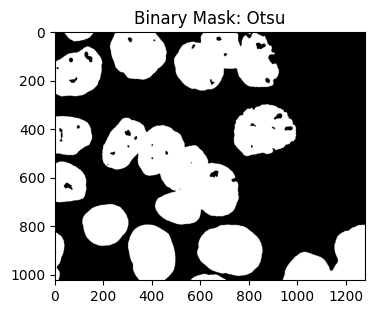

<ipython-input-23-c8dbb7f7b26c>:76: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem)


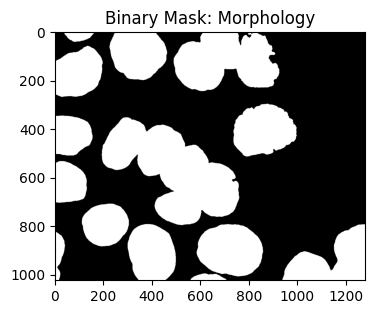

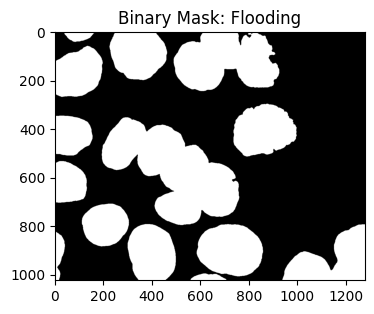

Minimum pixel value in flood_seg: False
Maximum pixel value in flood_seg: True


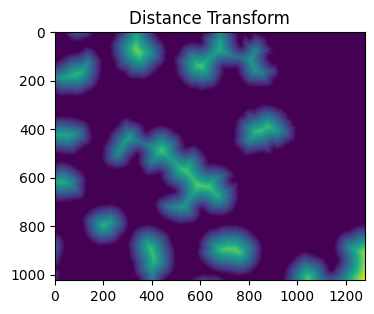

Minimum pixel value in distances: 0.0
Maximum pixel value in distances: 135.67977004697494
Contains NaN values in distances: False
Contains infinite values in distances: False


<ipython-input-23-c8dbb7f7b26c>:123: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(


Image 39, IoU=0.8342661257846252
Image 39, IoU=0.8342661257846252


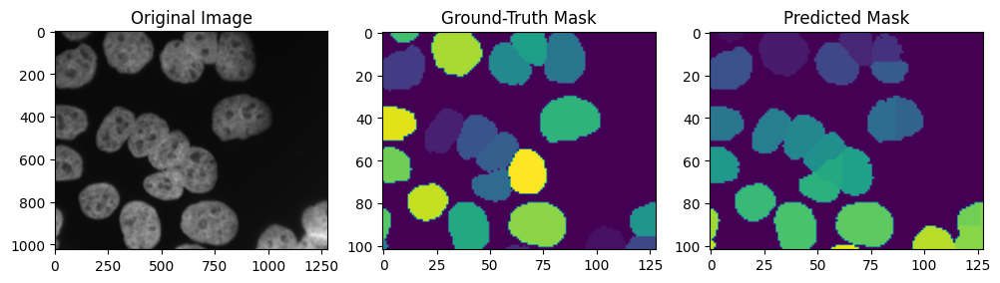

Average IoU=0.8656466145433921


In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from skimage import io,img_as_ubyte, segmentation, filters, morphology, measure, color
from sklearn.metrics import jaccard_score
from skimage.util import img_as_float
from skimage.measure import label
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from skimage.filters import threshold_otsu, threshold_multiotsu, gaussian
from skimage.filters.rank import median
from scipy.ndimage import median_filter, gaussian_laplace
from skimage import exposure
from skimage.morphology import binary_closing, binary_opening, binary_erosion, binary_dilation, remove_small_holes, disk, remove_small_objects
from skimage.measure import regionprops, label
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
# -----------------------------------------------------------------------------
#
#     FUNCTIONS
#
# -----------------------------------------------------------------------------

# ----------------------------- Segmentation function -------------------------
def cell_segmentation(img_file):
    """
    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
    %                                                                       %
    %  Template for implementing the main function of the segmentation      %
    % system: 'cell_segmentation'                                           %
    % - Input: path to the image to be segmented                     %
    % - Output: predicted segmentation mask                                 %
    %                                                                       %
    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

    CELL_SEGMENTATION:
    - - -  COMPLETE - - -
    """
    # Code for the BASELINE system
    # - - - IMPLEMENT HERE YOUR PROPOSED SYSTEM - - -

    image = io.imread(img_file)
    image = img_as_float(image)

    # Median filtering for noise reduction
    image_smoothed = median(image, disk(3))

    # Smoothed Image
    plt.figure(figsize=(4, 4))
    plt.imshow(image_smoothed, cmap='gray')
    plt.title("Smoothed Image")
    plt.show()

    # Show the minimum and maximum pixel values in order to later pre-define
    # a correct threshold to separe the background from the cells in the image
    min_pixel_value = np.min(image_smoothed)
    max_pixel_value = np.max(image_smoothed)
    print(f"Minimum pixel value: {min_pixel_value}")
    print(f"Maximum pixel value: {max_pixel_value}")

    # Thresholding using Otsu's method
    otsu_th = threshold_otsu(image_smoothed)
    binary_mask = image_smoothed > otsu_th

    # Otsu thresholded image
    plt.figure(figsize=(4, 4))
    plt.imshow(binary_mask, cmap='gray')
    plt.title("Binary Mask: Otsu")
    plt.show()

    # Morphological operations
    dilation_selem = disk(3)
    im_mask_dilation = binary_dilation(binary_mask, selem=dilation_selem) # dilation to add pixels to cell boundaries
    im_mask_erosion = binary_erosion(im_mask_dilation) # erosion to remove pixels from cell boundaries
    im_mask_holes = remove_small_holes(im_mask_erosion, area_threshold=1500) # remove holes inside cells

    # Morphological image
    plt.figure(figsize=(4, 4))
    plt.imshow(im_mask_holes, cmap='gray')
    plt.title("Binary Mask: Morphology")
    plt.show()

    # Define cell and background thresholds
    cell_thresh = 0.5
    bg_thresh = 0.3

    # Generate the basins for watershed
    basins = np.zeros_like(image) # get all 0's in shape of original image
    basins[im_mask_holes < bg_thresh] = 1 # set pixels smaller than background threshold to 1
    basins[im_mask_holes > cell_thresh] = 2 # set pixels bigger than cell threshold to 2

    # Watershed by flooding to define boundaries
    flood_seg = watershed(image, basins)
    flood_seg = flood_seg > 1.0 # threshold again to separate pixels, those greater than 1 are set to True, others False

    # Plot flooded mask
    plt.figure(figsize=(4, 4))
    plt.imshow(flood_seg, cmap='gray')
    plt.title("Binary Mask: Flooding")
    plt.show()

    # Check that pixels are divided into True and False
    print("Minimum pixel value in flood_seg:", np.min(flood_seg))
    print("Maximum pixel value in flood_seg:", np.max(flood_seg))

    # Compute the distance matrix by assigning a value for each pixel
    # corresponding to its Euclidean distance to the nearest background pixel
    distances = ndi.distance_transform_edt(flood_seg)

    # Distance Transform Plot
    plt.figure(figsize=(4, 4))
    plt.imshow(distances, cmap='viridis')
    plt.title("Distance Transform")
    plt.show()

    # Check the range of values in distances (max and min)
    print("Minimum pixel value in distances:", np.min(distances))
    print("Maximum pixel value in distances:", np.max(distances))

    # Check for NaN or infinite values in distances to check everything is correct
    contains_nan = np.isnan(distances).any()
    contains_inf = np.isinf(distances).any()
    print("Contains NaN values in distances:", contains_nan)
    print("Contains infinite values in distances:", contains_inf)

    #  Find the maxima
    local_max = peak_local_max( # find local maxima (points where intensity is greater than surrounding ones)
        distances, indices=False, footprint=None, labels=flood_seg, min_distance=10) # footprint is None so surrounding pixels are 8
    max_lab = label(local_max) # label each local maxima with a different label

    # Perform watershed again to differentiate between cells.
    final_seg = watershed(-distances, max_lab, mask=flood_seg) # use negative distances to create basins

    # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
    return final_seg

# ----------------------------- Evaluation function ---------------------------
def evaluate_masks(img_files, gt_mask_files):
    """ EVALUATE_MASKS:
        It receives two lists:
        1) A list of the paths to the images to be analysed
        2) A list of the paths to the corresponding Ground-Truth (GT)
            segmentations
        For each iamge on the list:
            It perform the segmentation
            It determines Jaccard Index
        Finally, it computes an average Jaccard Index for all the images in
        the list
    """
    def label2masks(label_image):
        M,N=label_image.shape
        Num_labels=np.max(label_image)
        masks=np.zeros((M,N,Num_labels),dtype=int)
        # print(f"Num_labels={Num_labels}")
        for l in range(1,Num_labels+1):
            masks[label_image==l,l-1]=1
        return masks

    # Getting the size of the images
    mask0=io.imread(gt_mask_files[0])
    M,N=mask0.shape
    # Downsampling factor to make the evaluation computationally efficient
    downs_f=0.1
    m=round(M*downs_f)
    n=round(N*downs_f)
    # Array containing the IoU associated with each image
    IoU=np.zeros(len(img_files))

    for i in range(len(img_files)):

        # Image segmentation & labeling
        predicted_mask = cell_segmentation(img_files[i])
        predicted_mask_label =label(predicted_mask)

        # Mask downsampling for computational reasons
        predicted_mask_label = cv2.resize(predicted_mask_label, (n, m), interpolation = cv2.INTER_NEAREST)

        # Reading and downsampling ground-truth segmentations
        gt_label = io.imread(gt_mask_files[i])
        gt_label = cv2.resize(gt_label, (n, m), interpolation = cv2.INTER_NEAREST)

        # Converting the groundtruth label images into individual masks (one per cell)
        gt_masks=label2masks(gt_label)
        # Number of cells (groundtruth segmentation)
        Num_gt_cells=np.max(gt_label)

        # Converting the predicted label images into individual masks (one per object)
        pred_masks=label2masks(predicted_mask_label)
        # Number of predicted objects
        Num_pred_cells=np.max(predicted_mask_label)

        # Computing the IoU of each cell with respect to the groundtruth segmentation
        # (aproximate estimation)
        IoU_max=np.zeros((Num_gt_cells,2))
        for gt in range(Num_gt_cells):
            scores=np.zeros(Num_pred_cells)
            for pred in range(Num_pred_cells):
                if (np.sum(gt_masks[:,:,gt])==0 or np.sum(pred_masks[:,:,pred])==0):
                    # print("zero check!")
                    scores[pred]=0.0
                else:
                    scores[pred]=jaccard_score(gt_masks[:,:,gt].flatten(), pred_masks[:,:,pred].flatten())

            # For each cell in the groudtruth segmentation,
            # IoU_max stores the maximum IoU achived after computing the IoU
            # with respect to each object in the predicted segmentation
            IoU_max[gt,0]=np.max(scores)
            IoU_max[gt,1]=np.argmax(scores)

        # The IoU of each image is computed as the average of IoU of each groundtruth cell
        IoU[i]=np.average(IoU_max[:,0])
        print (f"Image {i}, IoU={IoU[i]}")
        # The IoU of each image is computed as the average of IoU of each groundtruth cell
        IoU[i]=np.average(IoU_max[:,0])
        print (f"Image {i}, IoU={IoU[i]}")

        # Plotting images for visualization
        gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1])

        plt.figure(figsize=(12, 4))

        # Original Image
        plt.subplot(gs[0])
        plt.imshow(io.imread(img_files[i]), cmap='gray')
        plt.title('Original Image')

        # Ground-Truth Mask
        plt.subplot(gs[1])
        plt.imshow(gt_label, cmap='viridis')  # You can use a different colormap if needed
        plt.title('Ground-Truth Mask')

        # Predicted Mask
        plt.subplot(gs[2])
        plt.imshow(predicted_mask_label, cmap='viridis')  # You can use a different colormap if needed
        plt.title('Predicted Mask')
        plt.show()


    return np.average(IoU)

plt.close('all')

# -----------------------------------------------------------------------------
#
#     READING IMAGES
#
# -----------------------------------------------------------------------------

data_dir= os.curdir
path_im='/content/drive/My Drive/AUDIO/LS3_materials/Dataset/subset/rawimages'
path_gt='/content/drive/My Drive/AUDIO/LS3_materials/Dataset/subset/groundtruth'
img_files = [ os.path.join(data_dir,path_im,f) for f in sorted(os.listdir(os.path.join(data_dir,path_im)))
            if (os.path.isfile(os.path.join(data_dir,path_im,f)) and f.endswith('.tif')) ]

gt_mask_files = [ os.path.join(data_dir,path_gt,f) for f in sorted(os.listdir(os.path.join(data_dir,path_gt)))
            if (os.path.isfile(os.path.join(data_dir,path_gt,f)) and f.endswith('.tif')) ]
# img_files.sort()
# gt_mask_files.sort()
print("Number of train images", len(img_files))
print("Number of image masks", len(gt_mask_files))

# -----------------------------------------------------------------------------
#
#     Segmentation and evaluation
#
# -----------------------------------------------------------------------------

mean_score = evaluate_masks(img_files, gt_mask_files)
print(f"Average IoU={mean_score}")

# Visualize a segmented image (you can replace '0' with the index of the image you want to visualize)
# segmented_image = cell_segmentation(img_files[3])
# plt.imshow(segmented_image, cmap='viridis')
# plt.axis('off')
# plt.show()